# импорт пакетов

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.collections import LineCollection

from sklearn import preprocessing
from sklearn import metrics
from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import sklearn.metrics as mtrcs
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV


import seaborn as sns
from IPython.display import display
sns.set()
sns.set_context("talk")

%matplotlib inline

# пишем функции для массовой обработки

In [2]:
def drawColumnAsTimeSeries(data, name, trueName=None, drawSeqLine=True):

    # значения заполненных данных
    y1=data[name][data[name].notna()].values
    # индексы заполненных данных (от 1 до ...) для графиков
    x1=data[name][data[name].notna()].index+1
    # индексы пропущенных данных (от 1 до ...) для графиков
    x2=data[name][data[name].isnull()].index+1
    # массив для значений интерполированных данных
    y2=np.zeros(len(x2))

    fig, ax = plt.subplots(figsize=(25,5))
    ax.scatter(x1,y1, color='green', marker='d', label='данные')
    if drawSeqLine:
        a=x1[0]
        xx1=[]
        xx1.append(x1[0])
        yy1=[]
        yy1.append(y1[0])
        collect=[]
        for i in range(len(x1)-1):
            if (x1[i+1]-a)==1:
                xx1.append(x1[i+1])
                yy1.append(y1[i+1])
                a=x1[i+1]
            else:
                if len(xx1)>1:
                    ax.plot(xx1,yy1, color='blue')
                a=x1[i+1]
                xx1=[]
                xx1.append(x1[i+1])
                yy1=[]
                yy1.append(y1[i+1])        

    ax.scatter(x2,y2, color='orange', marker='.', label='пропущенные значения (0)')
    ax.hlines(np.mean(y1),1,len(data.index), color='red', label='среднее')
    ax.set_xlim(1,365)
    ax.legend(fontsize=14)
    if trueName==None:
        ax.set_title(name, fontsize=16)
    else:
        ax.set_title(trueName, fontsize=16)
    # plt.savefig('report_v2/missingValuesRaw_AE1.png', dpi=300, bbox_inches='tight')
    plt.show()


In [3]:
def drawFillNan(data, name, trueName):
    y1=data[name][data[name].notna()].values
    x1=data[name][data[name].notna()].index+1

    xEmpty=data[name][data[name].isnull()].index+1
    yMean=np.array(len(xEmpty)*[np.mean(y1)])
    yMedian=np.array(len(xEmpty)*[np.median(y1)])

    xWhole=np.concatenate((x1,xEmpty), axis=None)
    yWholeMean=np.concatenate((y1,yMean), axis=None)[xWhole.argsort()]
    yWholeMedian=np.concatenate((y1,yMedian), axis=None)[xWhole.argsort()]
    xWhole=xWhole[xWhole.argsort()]

    dataAE1=data[name].copy()
    yPad=dataAE1.fillna(method='pad').copy()
    yIntLin=dataAE1.interpolate(method='linear').copy()
    yIntCubic=dataAE1.interpolate(method='cubic').copy()
    yIntQuadr=dataAE1.interpolate(method='quadratic').copy()
    yIntSpline=dataAE1.interpolate(method='spline', order=2).copy() 

    fig, ax = plt.subplots(figsize=(25,5))

    ax.scatter(x1,y1, color='green', marker='d', label='данные')

    ax.plot(xWhole,yWholeMean, color='orange', marker='.', label='Mean')
    #ax.plot(xWhole,yWholeMedian, color='orange', marker='.', label='Median')
    ax.plot(xWhole,yPad.values, color='red', marker='.', label='pad')
    ax.plot(xWhole,yIntLin.values, color='blue', marker='.', label='Interpolation Linear')
    ax.plot(xWhole,yIntCubic.values, color='black', marker='.', label='Interpolation Cubic')
    ax.plot(xWhole,yIntCubic.values, color='green', marker='.', label='Interpolation Quadratic')
    ax.plot(xWhole,yIntCubic.values, color='purple', marker='.', label='Interpolation Spline(2)')
    ax.set_xlim(1,len(data.index))
    #ax.set_xlim(100,130)
    ax.legend(fontsize=14)
    ax.set_title(trueName, fontsize=16)
    #plt.savefig('report_v2/missingValuesInterpollated_AE1.png', dpi=300, bbox_inches='tight')
    plt.show()   


In [4]:
def drawHistograms(data, name, trueName=None):
    plt.figure(figsize=(12, 8))
    if trueName==None:
        label=name
    else:
        label=trueName
    sns.distplot( data[name], color='g', bins=50, 
            hist_kws={'alpha': 0.5}, axlabel=label )
    plt.show()


In [5]:
def analyzeMissingValues(data):
    print('=======================================================')
    print('Пропущенные данные (из', len(data.index),'записей):')
    print(data.isnull().sum())
    print('=======================================================')
    print('Пропущенные данные, % (из', len(data.index),'записей):')
    print(data.isnull().sum()/len(data.index)*100)
    print('=======================================================')


In [6]:
def drawCorrMatrix(data, colomunsToRemove=None):
    if colomunsToRemove==None:
        corr = dataSingleUnit.corr()
    else:
        corr = dataSingleUnit.drop(['Temp','KO'], axis=1).corr()
    plt.figure(figsize=(12, 10))
    ax = sns.heatmap(corr, annot=True, vmax=1, vmin=-1, cmap='RdYlGn')
    ax.set_title('Корреляции независимых переменных', fontsize=20)
    plt.tight_layout(pad=0.4)
    plt.show()


In [7]:
def analyzeCorrWithTargets(data, targets, threshold=0.3):
    
    print('#################################################')
    print('###### Корреляция с целевыми переменными   ######')
    print('#################################################')
    
    for name in targets:
        print('')
        print('Корреляция с переменной \'',name,'\':')
        display(data.corr()[name].drop(targets).sort_values(ascending=False))
        print('-------------------------------------------------')
            
        if len(data.corr()[name].drop(targets)[abs(data.corr()[name].drop(targets))>threshold].sort_values(ascending=False).values)==0:
            print('Нет корреляций больше заданного порога (', threshold, ')')
        else:
            print('Корреляции больше заданного порога (', threshold, ') с переменной',name,':')
            display(data.corr()[name].drop(targets)[abs(data.corr()[name].drop(targets))>threshold].sort_values(ascending=False))
        print('-------------------------------------------------')


In [8]:
def drawPairPlots(data, inputColunms, targetColumns, trueNamesDict=None):
    
    for yName in targetColumns:
        
        for i in range(0, len(inputColunms), 2):

            ax=sns.pairplot(data=data,
                        x_vars=inputColunms[i:i+2],
                        y_vars=yName,
                        plot_kws={
                                    'line_kws':{'color':'orange'},
                                    'scatter_kws': {'color': 'g', 's': 7}
                                },
                        diag_kind='kde', kind='reg', height=7)
            
            if trueNamesDict != None:
                for ax_ in ax.axes.flat:
                    ax_.tick_params(axis='y', labelleft=True) # method 1
                    # ax_.yaxis.set_tick_params(labelleft=True) # method 2
                    ax_.set_xlabel(trueNamesDict[ax_.get_xlabel()])
                    ax_.set_ylabel(trueNamesDict[yName])
            ax.fig.tight_layout()


In [9]:
def drawPCAFlatPlot(pcaData, data, targetColumns, trueNamesDict=None):
    for name in targetColumns:
        fig, ax = plt.subplots(figsize=(10,10))
        ax1=ax.scatter(pcaData[:,0],pcaData[:,1], c=data[name], cmap=cm.jet)
        if trueNamesDict != None:
            ax.set_title(trueNamesDict[name], fontsize=16)    
        else:
            ax.set_title(name, fontsize=16)
        ax.set_xlabel('pca_var_1')
        ax.set_ylabel('pca_var_2')
        fig.colorbar(ax1, ax=ax)
        plt.tight_layout(pad=0.4)
        plt.show()


In [10]:
def drawPCA3DPlot(pcaData, data, targetColumns, trueNamesDict=None):
    for name in targetColumns:
        fig = plt.figure(figsize=(18,8))

        ax = fig.add_subplot(121, projection='3d')
        ax.plot_trisurf(pcaData[:,0],pcaData[:,1],
            data[name], cmap=cm.jet, linewidth=0)
        ax.set_xlabel('pca_var_1')
        ax.set_ylabel('pca_var_2')
        ax.set_xlabel('pca_var_1',labelpad=15)
        ax.set_ylabel('pca_var_2',labelpad=15)
        ax.set_facecolor('white') 

        ax = fig.add_subplot(122, projection='3d')
        ax.scatter(pcaData[:,0],pcaData[:,1],
            data[name], cmap=cm.jet, linewidth=0)
        ax.set_xlabel('pca_var_1',labelpad=15)
        ax.set_ylabel('pca_var_2',labelpad=15)
        ax.set_facecolor('white') 

        if trueNamesDict != None:
            fig.suptitle(trueNamesDict[name], fontsize=16)
        else:
            fig.suptitle(name, fontsize=16)

        fig.tight_layout()

        plt.show()


In [11]:
def analyzeLinModels(data, inputNames, targetName, realNamesDict=None, numRuns=40):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    
    mse=[]
    r2score=[]
    mae=[]


    for run in range(numRuns):
        trainInputs, testInputs, trainTargets, testTargets = train_test_split(X, Y, test_size=0.25)
        # linear
        linearModel=LinearRegression()
        linearModel.fit(trainInputs,trainTargets)
        predicted = linearModel.predict(testInputs)
        mse.append( mtrcs.mean_squared_error(testTargets, predicted, squared=False) )
        r2score.append( mtrcs.r2_score(testTargets, predicted) )
        mae.append( mtrcs.mean_absolute_error(testTargets, predicted) )
    
    rez=pd.DataFrame({
                        'best': [np.min(mse), np.max(r2score), np.min(mae)],  
                        'mean': [np.mean(mse), np.mean(r2score), np.mean(mae)], 
                        'std': [np.std(mse), np.std(r2score), np.std(mae)],
                        'median': [np.median(mse), np.median(r2score), np.median(mae)], 
                        'worst':[np.max(mse), np.min(r2score), np.max(mae)]  
                    }, index=['mse','r2Score','mae'])

    return rez


In [12]:
def buildLinModels(data, inputNames, targetName, realNamesDict=None, drawRez=False):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    # linear
    linearModel=LinearRegression()
    linearModel.fit(X,Y)
    predicted = linearModel.predict(X)
    mse =  mtrcs.mean_squared_error(Y, predicted, squared=False) 
    r2score =  mtrcs.r2_score(Y, predicted) 
    mae =  mtrcs.mean_absolute_error(Y, predicted)
    coef=pd.DataFrame({"Переменная": inputNames, "Coefficients": linearModel.coef_})
    coef.loc[len(coef)]=['intercept_coef', linearModel.intercept_]

    if drawRez:
        xAxis=np.arange(1,len(Y)+1)
        fig, ax = plt.subplots(figsize=(25,5))
        ax.scatter(xAxis,Y, color='green', marker='.', label='данные')
        ax.scatter(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(25,5))
        ax.plot(xAxis,Y, color='green', marker='.', label='данные')
        ax.plot(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()        

    return {'mse':mse, 'r2score':r2score, 'mae':mae}, coef


In [13]:
def analyzeSVRModels(data, inputNames, targetName, realNamesDict=None, numRuns=40, verbose=True):

    X=data[inputNames].copy()
    Y=data[targetName].copy()
    
    mse=[]
    r2score=[]
    mae=[]

    print('--------------------------------------------')
    print('SVR model analysis starts.')
    for run in range(numRuns):
        trainInputs, testInputs, trainTargets, testTargets = train_test_split(X, Y, test_size=0.25)
 
        parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
        modelSVR=SVR()
        
        gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
        gridSVR.fit(trainInputs,trainTargets)
        bestModel = gridSVR.best_estimator_
        
        bestModel.fit(trainInputs,trainTargets)
        predicted = bestModel.predict(testInputs)

        mse.append( mtrcs.mean_squared_error(testTargets, predicted, squared=False) )
        r2score.append( mtrcs.r2_score(testTargets, predicted) )
        mae.append( mtrcs.mean_absolute_error(testTargets, predicted) )

        if verbose:
            print('Run', run+1, 'from',numRuns)
    
    rez=pd.DataFrame({
                        'best': [np.min(mse), np.max(r2score), np.min(mae)],  
                        'mean': [np.mean(mse), np.mean(r2score), np.mean(mae)], 
                        'std': [np.std(mse), np.std(r2score), np.std(mae)],
                        'median': [np.median(mse), np.median(r2score), np.median(mae)], 
                        'worst':[np.max(mse), np.min(r2score), np.max(mae)]  
                    }, index=['mse','r2Score','mae'])
    print('All runs are done.')
    return rez


In [14]:
def buildSVRModels(data, inputNames, targetName, realNamesDict=None, drawRez=False):
    
    X=data[inputNames].copy()
    Y=data[targetName].copy()
    # SVR
    parameters = {'C':[0.5, 1, 2.5, 5, 7.5, 10], 'epsilon': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1]}
    modelSVR=SVR()
    gridSVR=GridSearchCV(modelSVR, parameters, scoring='neg_root_mean_squared_error')
    gridSVR.fit(X,Y)
    bestModel = gridSVR.best_estimator_
    
    bestModel.fit(X,Y)
    predicted = bestModel.predict(X)    
    
    mse =  mtrcs.mean_squared_error(Y, predicted, squared=False) 
    r2score =  mtrcs.r2_score(Y, predicted) 
    mae =  mtrcs.mean_absolute_error(Y, predicted)

    if drawRez:
        xAxis=np.arange(1,len(Y)+1)
        fig, ax = plt.subplots(figsize=(25,5))
        ax.scatter(xAxis,Y, color='green', marker='.', label='данные')
        ax.scatter(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()

        fig, ax = plt.subplots(figsize=(25,5))
        ax.plot(xAxis,Y, color='green', marker='.', label='данные')
        ax.plot(xAxis,predicted, color='red', marker='.', label='модель')
        ax.set_xlim(1,len(Y)+1)
        ax.legend(fontsize=14)
        if realNamesDict==None:
            ax.set_title(targetName, fontsize=16)
        else:
            ax.set_title(realNamesDict[targetName], fontsize=16)
        plt.tight_layout()
        plt.show()        

    return {'mse':mse, 'r2score':r2score, 'mae':mae}, bestModel


 # Импорт данных и названий переменных

In [2]:
# get names for units
units = pd.read_excel('raw\Техпараметры.xlsx',\
    skiprows=3, nrows=1, header=None)
unitNames=units.dropna(axis=1).iloc[[0]].values[0]
len(unitNames)


168

In [3]:
paramNames=['Ур-нь металла, см', 'Ур-нь электролита, см',
    'Температура, С', 'КО',	'CaF2, %', 'Шумы, В',
    'Рабочее напряжение, В', 'Среднее время МАЙНА, сек',
    'Кол-во доз АПГ в автомат. режиме',	
    'Уставка АПГ, мин', 'Перепад напряжения в подине']
columnNames = ['Metal', 'Electrolyte', 'Temp',
    'KO', 'CAF2', 'Noise', 'Voltage', 'Mynah', 
    'Doze', 'APG', 'dVoltage']
paramNamesDictionary = dict(zip(columnNames, paramNames))    
inputNames = ['Metal', 'Electrolyte',
     'CAF2', 'Noise', 'Voltage', 'Mynah', 
    'Doze', 'APG', 'dVoltage']
outputNames=[ 'Temp', 'KO']    
columnsNumber=11

# ДЛя примера. Анализ первого набора данных (электролизера) из 168

In [4]:

dataSingleUnit = pd.read_excel('raw\Техпараметры.xlsx',\
    skiprows=5, usecols=range(2,2+11), header=None)
dataSingleUnit.columns=columnNames

# описательная статистика

In [18]:
# check dataframe
display( dataSingleUnit.info() )
display( dataSingleUnit.head() )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 455 entries, 0 to 454
Data columns (total 11 columns):
Metal          342 non-null float64
Electrolyte    342 non-null float64
Temp           342 non-null float64
KO             125 non-null float64
CAF2           125 non-null float64
Noise          455 non-null float64
Voltage        455 non-null float64
Mynah          446 non-null float64
Doze           455 non-null int64
APG            455 non-null float64
dVoltage       26 non-null float64
dtypes: float64(10), int64(1)
memory usage: 39.2 KB


None

,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,17.0,14.0,961.0,2.20,5.05,0.023,4.132,41.0,4078,1.4,NaN
1,17.0,16.0,953.0,NaN,NaN,0.013,4.057,4.0,4267,1.3,NaN
2,NaN,NaN,NaN,NaN,NaN,0.015,4.122,20.0,4130,1.3,NaN
3,17.0,13.0,960.0,NaN,NaN,0.015,4.045,33.0,3585,1.3,NaN
4,17.0,19.0,953.0,2.18,5.14,0.023,4.094,25.0,3876,1.4,NaN


In [19]:
# descriptive stats
dataSingleUnit.describe()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
count,342.000000,342.000000,342.000000,125.000000,125.000000,455.000000,455.000000,446.000000,455.000000,455.000000,26.000000
mean,17.736842,16.181287,964.511696,2.250560,5.136080,0.011967,4.014637,14.919283,4062.553846,1.380879,306.192308
std,0.785342,1.755394,7.184100,0.070669,0.176594,0.004100,0.062526,8.966241,165.793689,0.047946,11.264171
min,15.000000,10.000000,944.000000,2.110000,4.600000,0.007000,3.872000,2.000000,3327.000000,1.300000,284.000000
25%,17.000000,15.000000,960.000000,2.200000,5.040000,0.009000,3.967000,9.000000,3972.000000,1.400000,299.500000
50%,18.000000,16.000000,964.000000,2.250000,5.140000,0.011000,4.003000,13.000000,4068.000000,1.400000,306.000000
75%,18.000000,17.000000,968.000000,2.290000,5.250000,0.014000,4.061000,19.000000,4168.500000,1.400000,310.000000
max,23.000000,21.000000,986.000000,2.460000,5.580000,0.034000,4.229000,52.000000,4501.000000,1.600000,336.000000


# распределения (гистограммы) данных

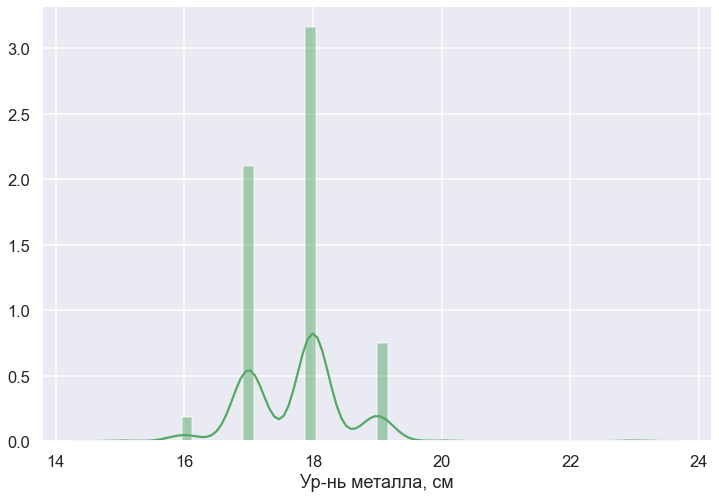

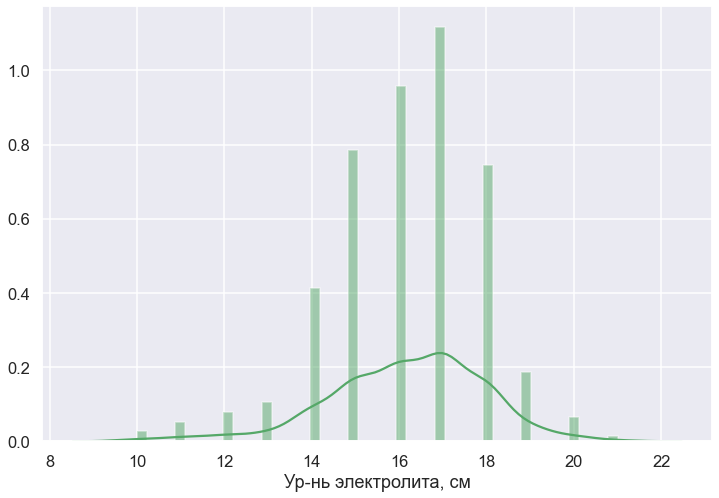

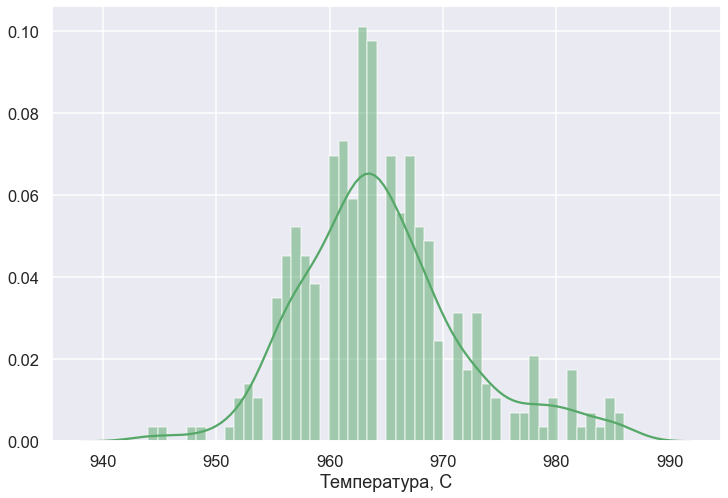

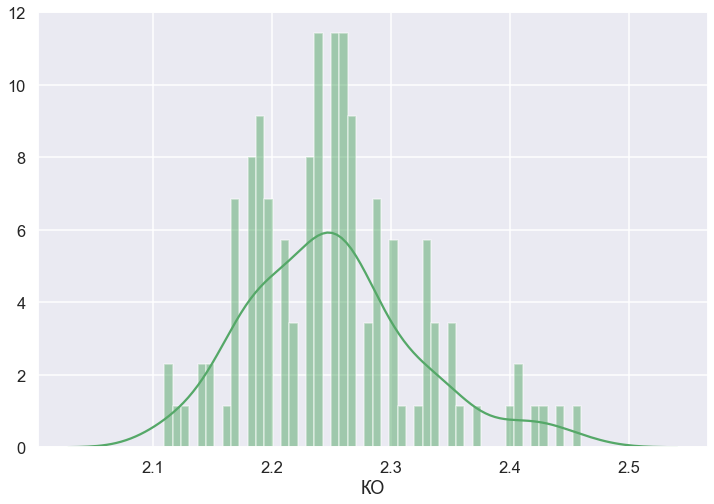

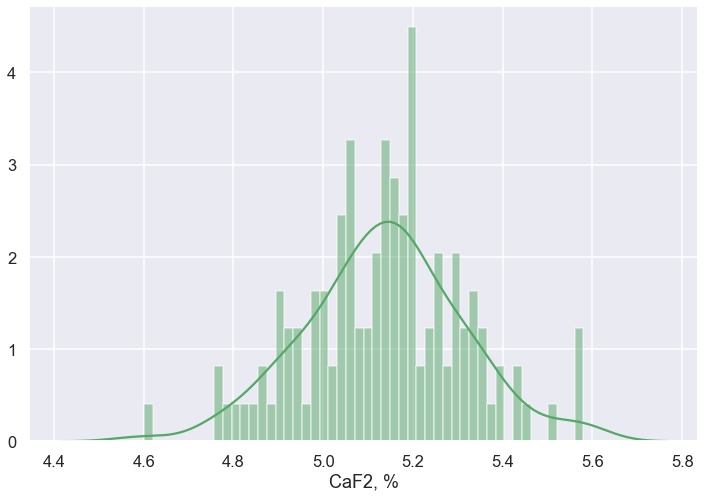

...

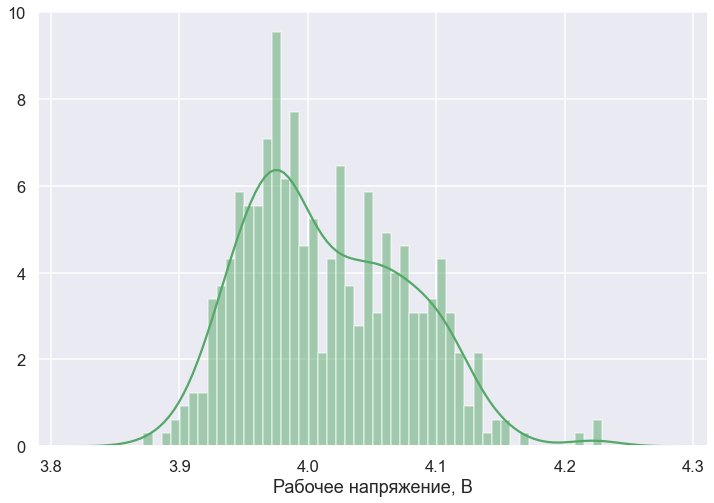

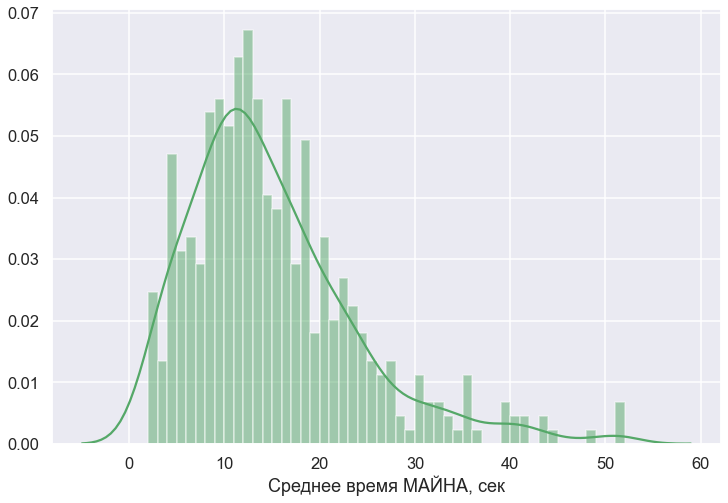

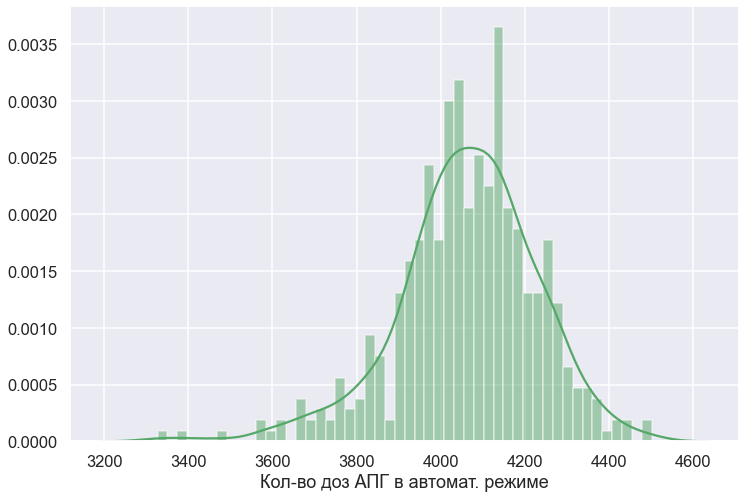

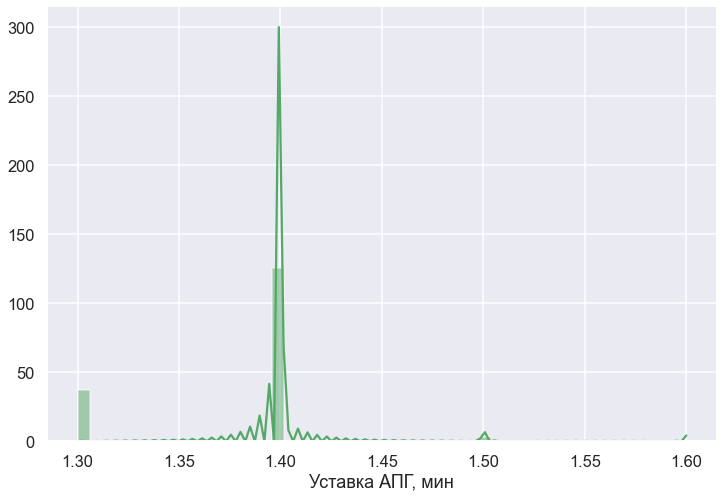

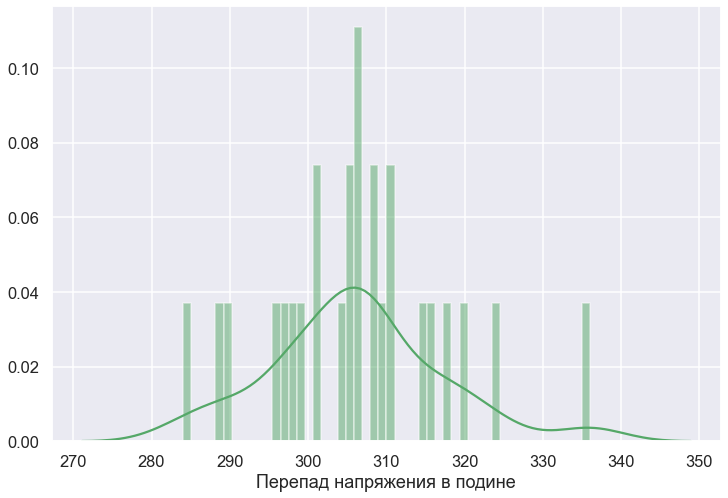

In [20]:
# draw distributions
for i in range(columnsNumber):
    drawHistograms(dataSingleUnit, columnNames[i],paramNames[i])


# нормализация данных

In [6]:
# normalize [0,1]
dataSingleUnitScaled=[]
for i in range(columnsNumber):
    scaler = preprocessing.MinMaxScaler()
    x_scaled = scaler.fit_transform(dataSingleUnit)
    dataSingleUnitScaled = pd.DataFrame(x_scaled)
dataSingleUnitScaled.columns=columnNames
dataSingleUnitScaled.head()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,0.25,0.363636,0.404762,0.257143,0.459184,0.592593,0.728291,0.78,0.639693,0.333333,NaN
1,0.25,0.545455,0.214286,NaN,NaN,0.222222,0.518207,0.04,0.800681,0.000000,NaN
2,NaN,NaN,NaN,NaN,NaN,0.296296,0.700280,0.36,0.683986,0.000000,NaN
3,0.25,0.272727,0.380952,NaN,NaN,0.296296,0.484594,0.62,0.219761,0.000000,NaN
4,0.25,0.818182,0.214286,0.200000,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,NaN


# анализ пропусков

In [22]:
# missing values analysis
analyzeMissingValues(dataSingleUnit)


Пропущенные данные (из 455 записей):
Metal          113
Electrolyte    113
Temp           113
KO             330
CAF2           330
Noise            0
Voltage          0
Mynah            9
Doze             0
APG              0
dVoltage       429
dtype: int64
Пропущенные данные, % (из 455 записей):
Metal          24.835165
Electrolyte    24.835165
Temp           24.835165
KO             72.527473
CAF2           72.527473
Noise           0.000000
Voltage         0.000000
Mynah           1.978022
Doze            0.000000
APG             0.000000
dVoltage       94.285714
dtype: float64


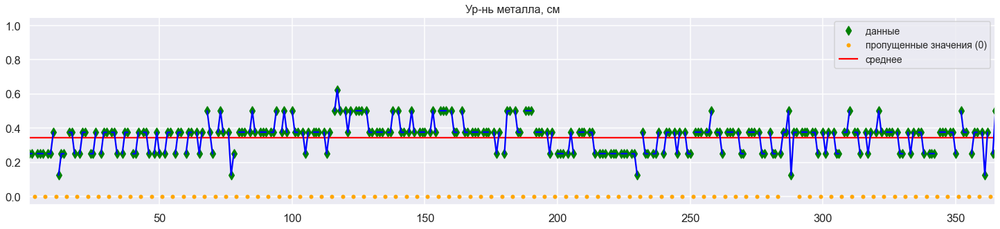

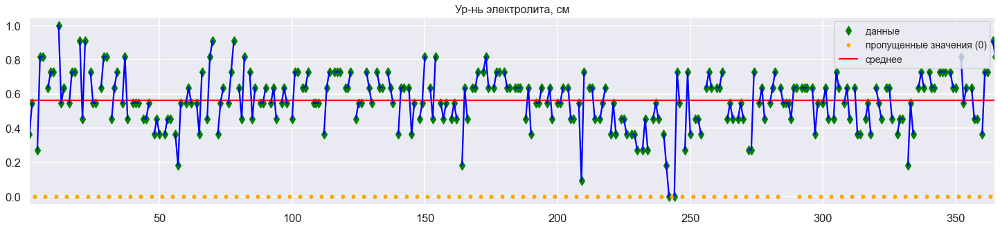

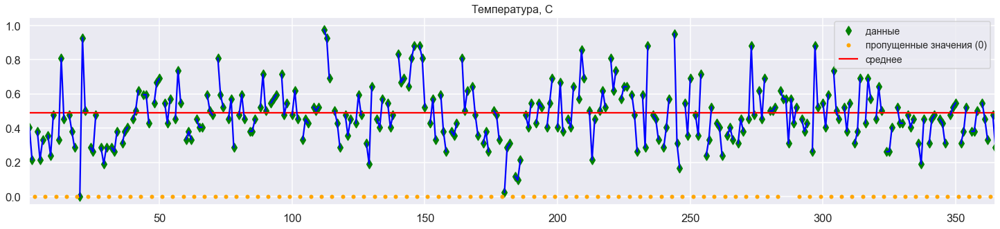

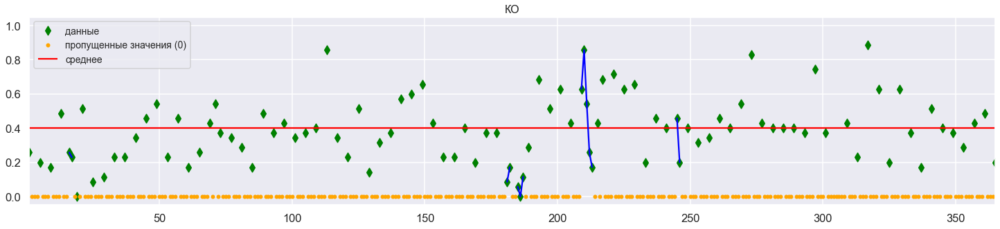

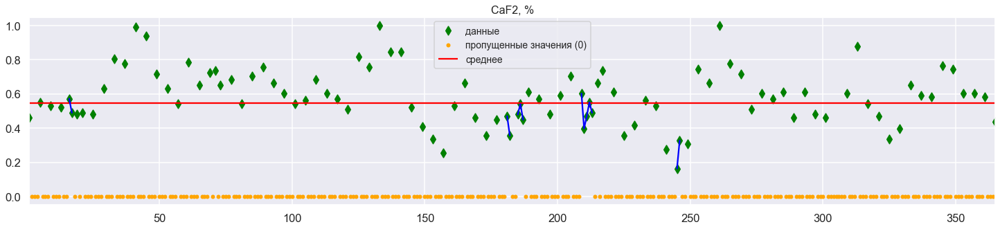

...

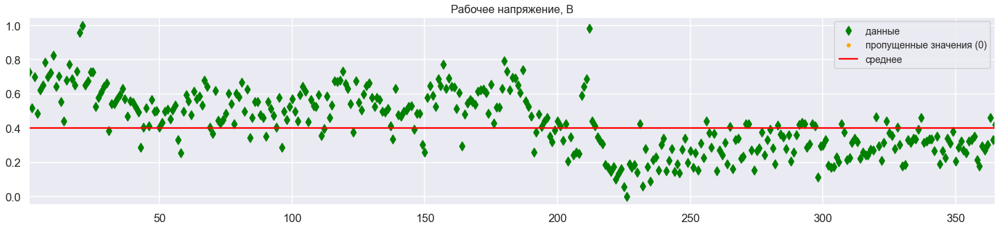

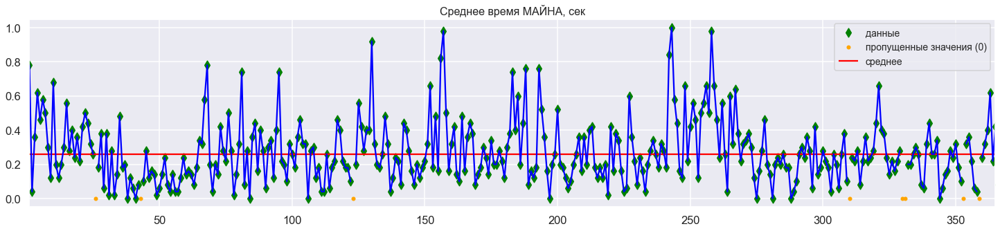

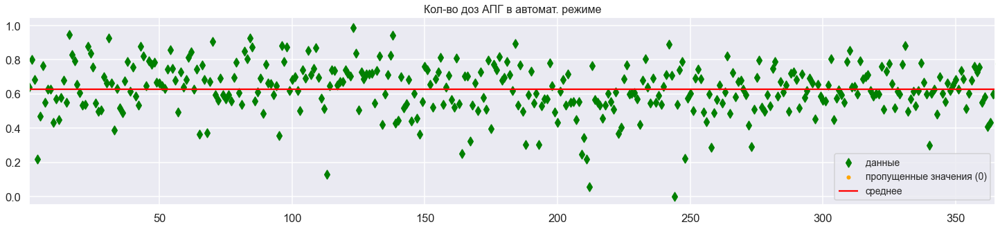

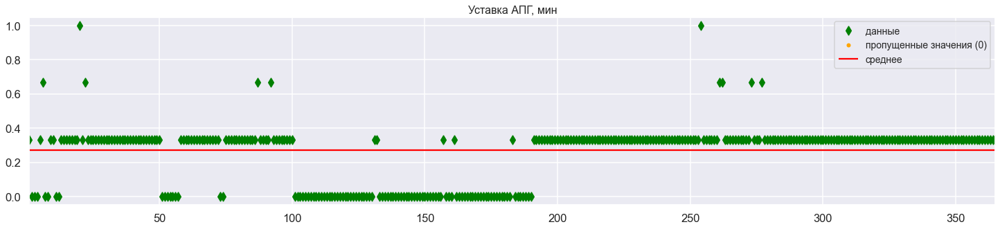

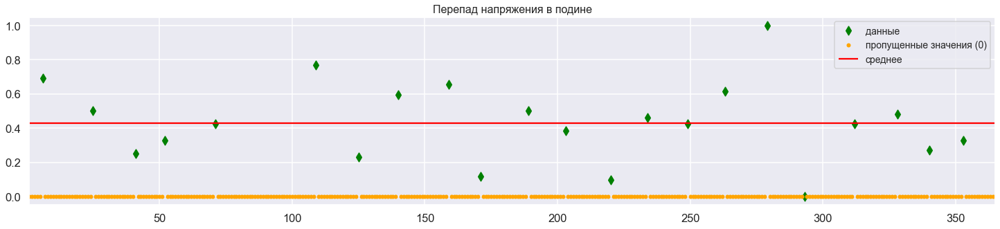

In [23]:
# plot data
for i in range(columnsNumber):
    drawColumnAsTimeSeries(dataSingleUnitScaled, columnNames[i], paramNames[i])


# Заполнение интерполяцией

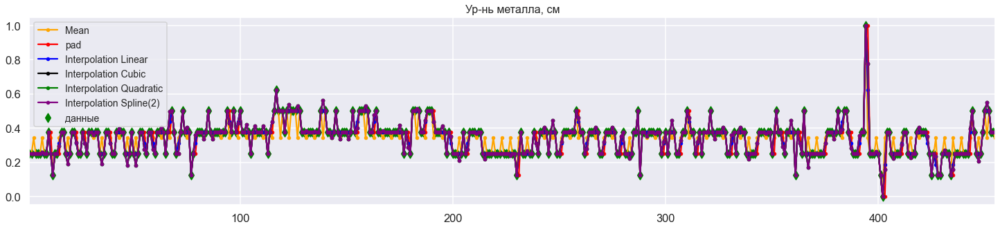

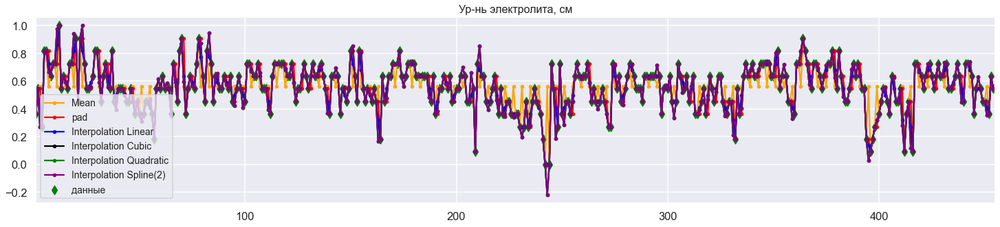

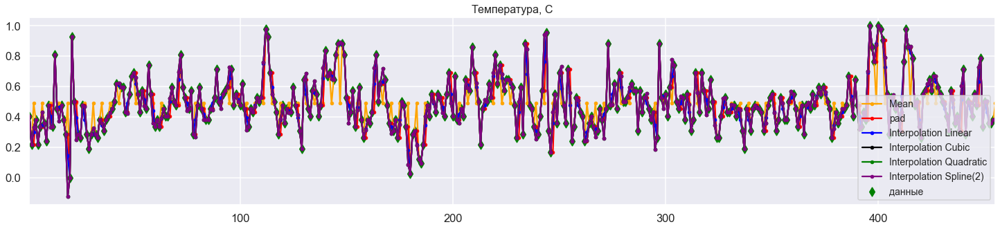

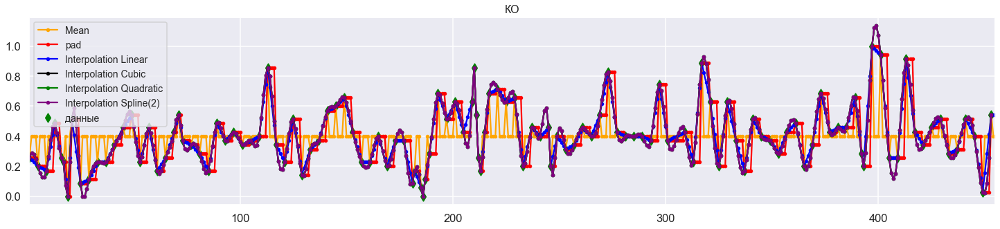

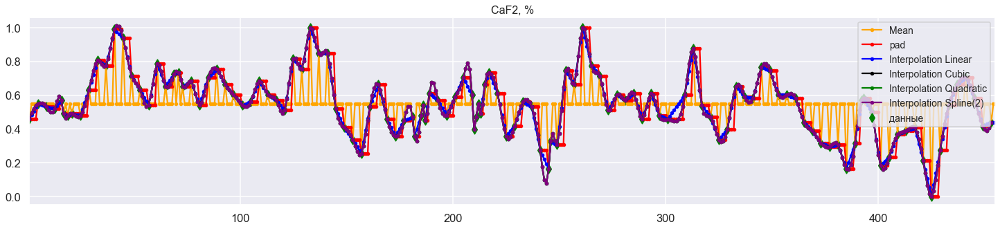

...

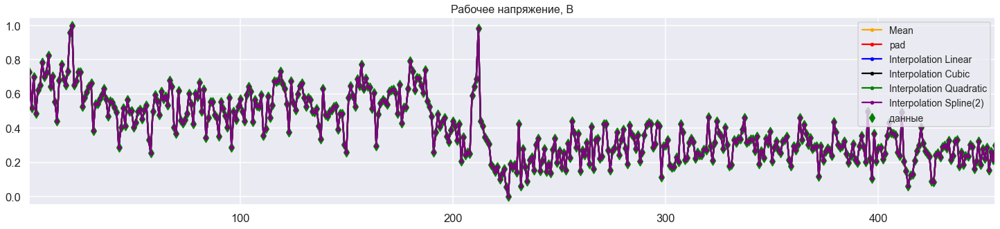

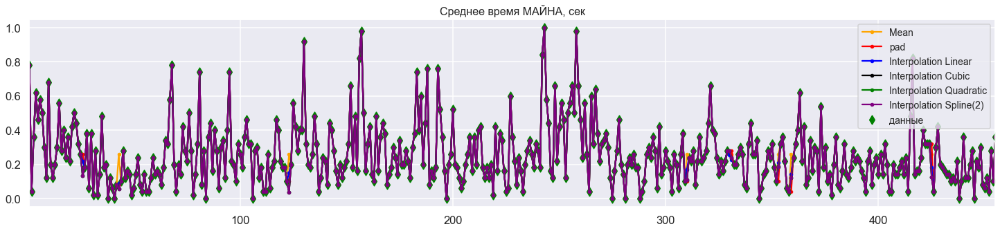

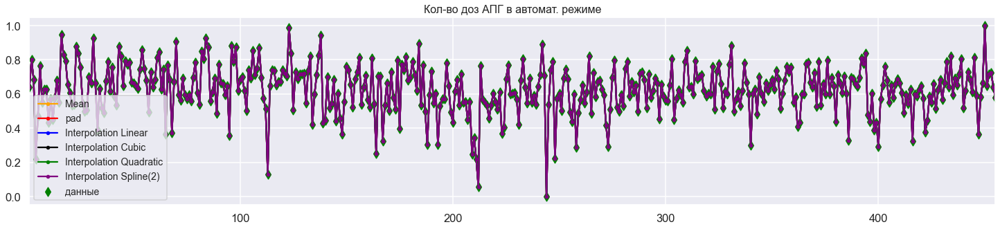

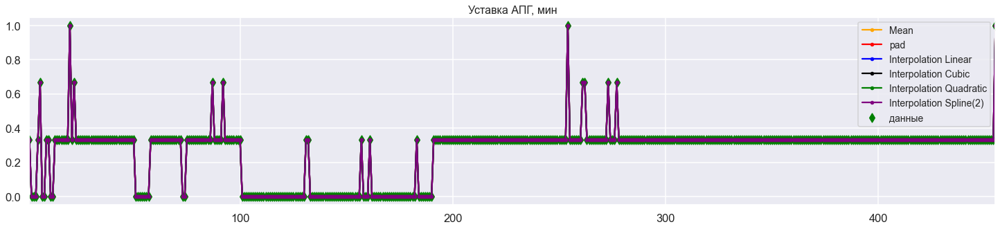

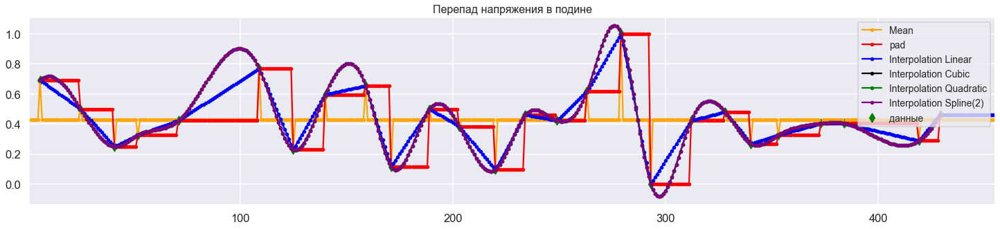

In [24]:
# plot data with interpolations
for i in range(columnsNumber):
    drawFillNan(dataSingleUnitScaled,columnNames[i],paramNames[i])


# Корреляционный анализ

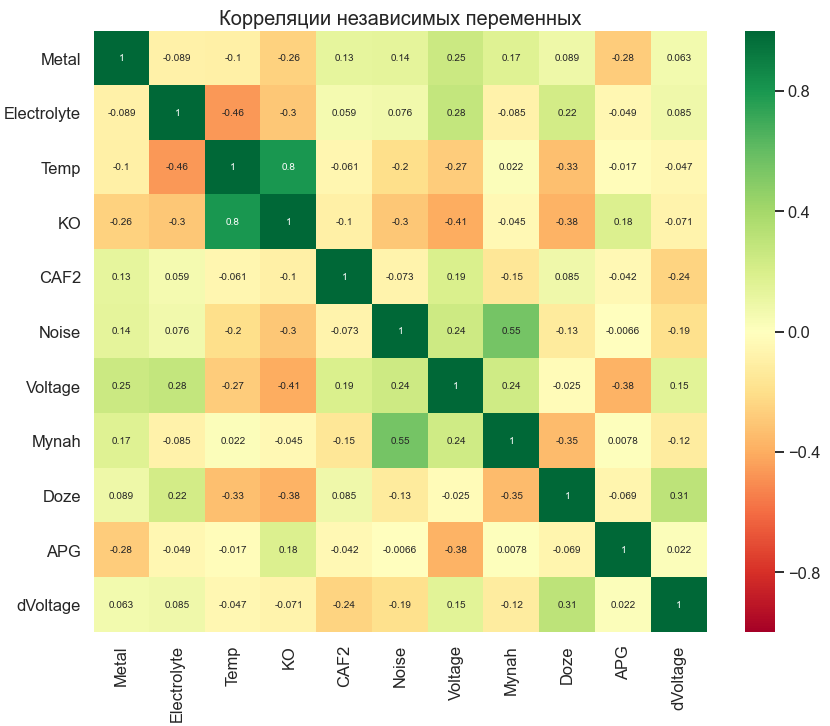

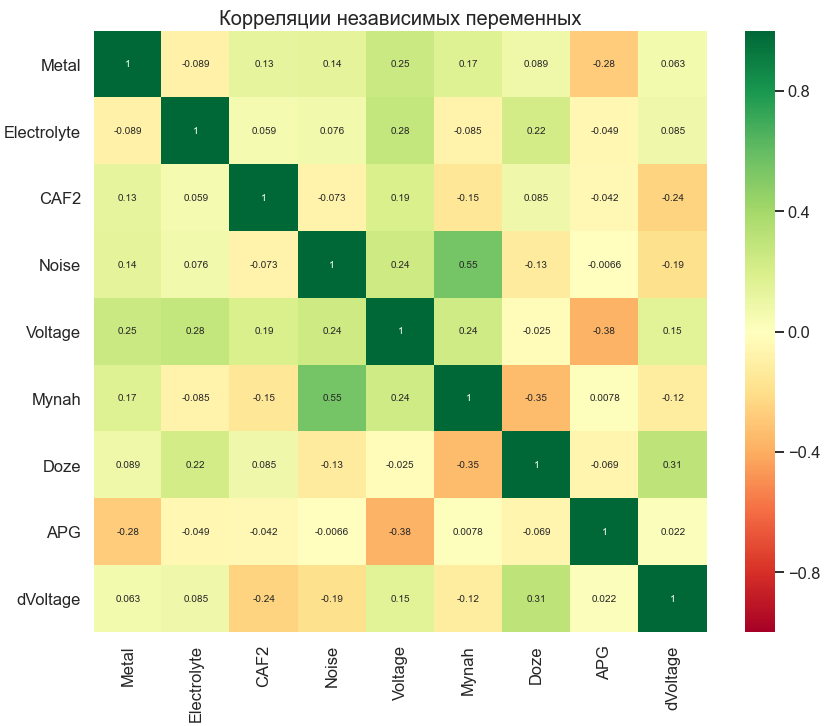

In [25]:
# plot correlation analysis
drawCorrMatrix(dataSingleUnit)
drawCorrMatrix(dataSingleUnit, ['Temp','KO'])


In [26]:
analyzeCorrWithTargets(dataSingleUnit,outputNames)


#################################################
###### Корреляция с целевыми переменными   ######
#################################################

Корреляция с переменной ' Temp ':


Mynah          0.022218
APG           -0.016779
dVoltage      -0.046982
CAF2          -0.060778
Metal         -0.100809
Noise         -0.202595
Voltage       -0.273572
Doze          -0.329548
Electrolyte   -0.462227
Name: Temp, dtype: float64

-------------------------------------------------
Корреляции больше заданного порога ( 0.3 ) с переменной Temp :


Doze          -0.329548
Electrolyte   -0.462227
Name: Temp, dtype: float64

-------------------------------------------------

Корреляция с переменной ' KO ':


APG            0.184961
Mynah         -0.045021
dVoltage      -0.071122
CAF2          -0.101537
Metal         -0.257075
Noise         -0.298604
Electrolyte   -0.299246
Doze          -0.378670
Voltage       -0.406063
Name: KO, dtype: float64

-------------------------------------------------
Корреляции больше заданного порога ( 0.3 ) с переменной KO :


Doze      -0.378670
Voltage   -0.406063
Name: KO, dtype: float64

-------------------------------------------------


# Графики парных зависимостей

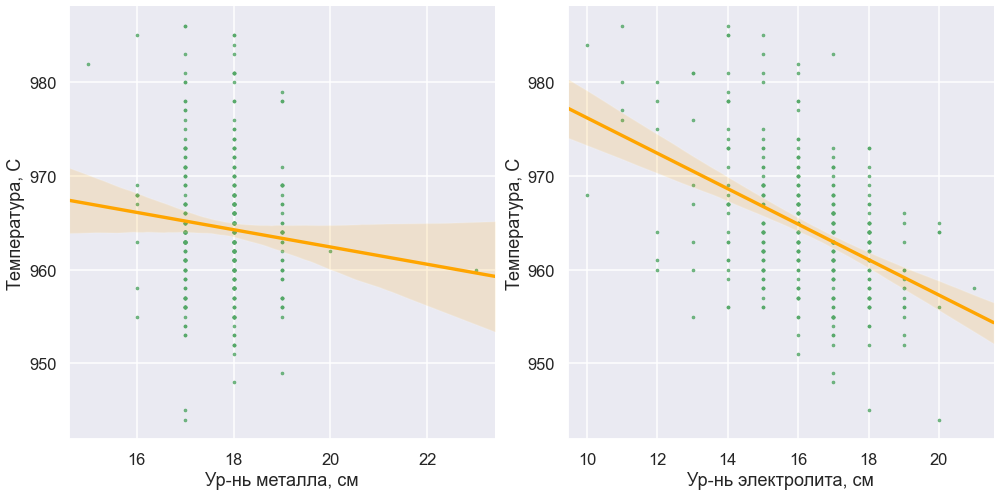

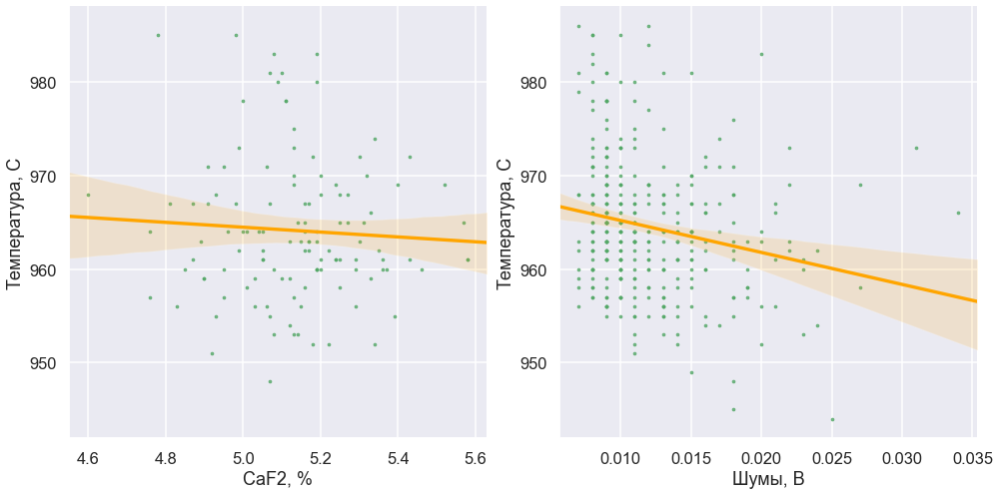

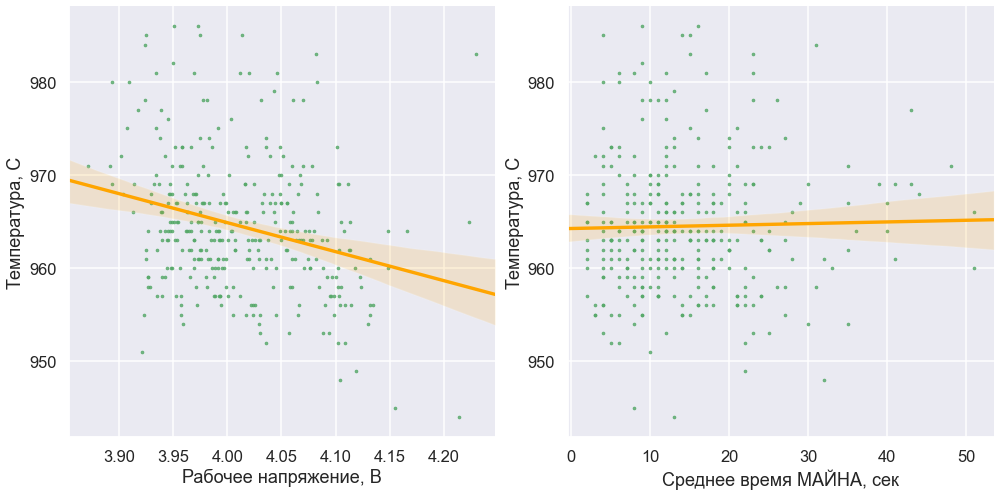

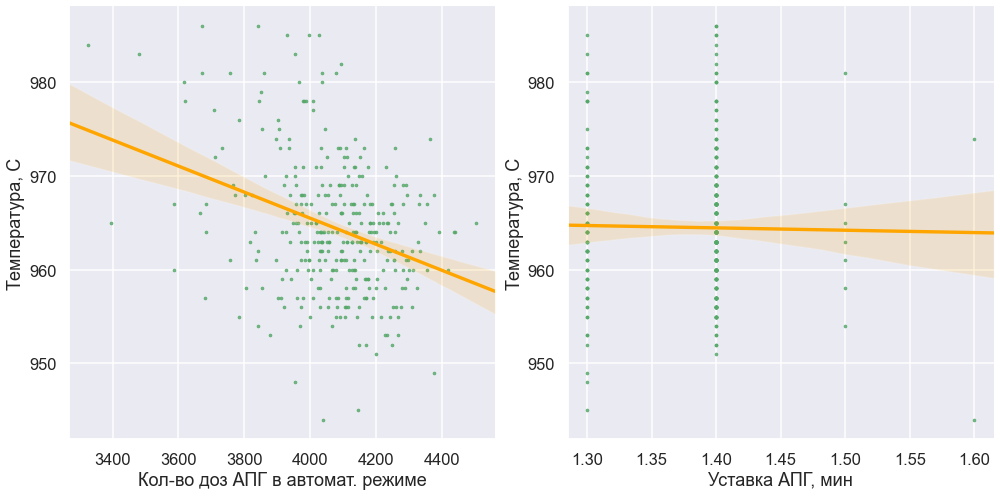

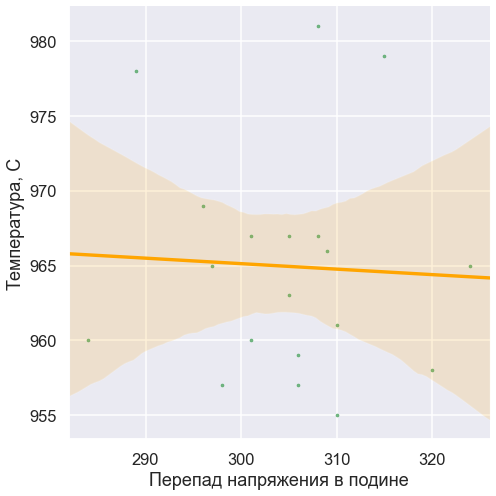

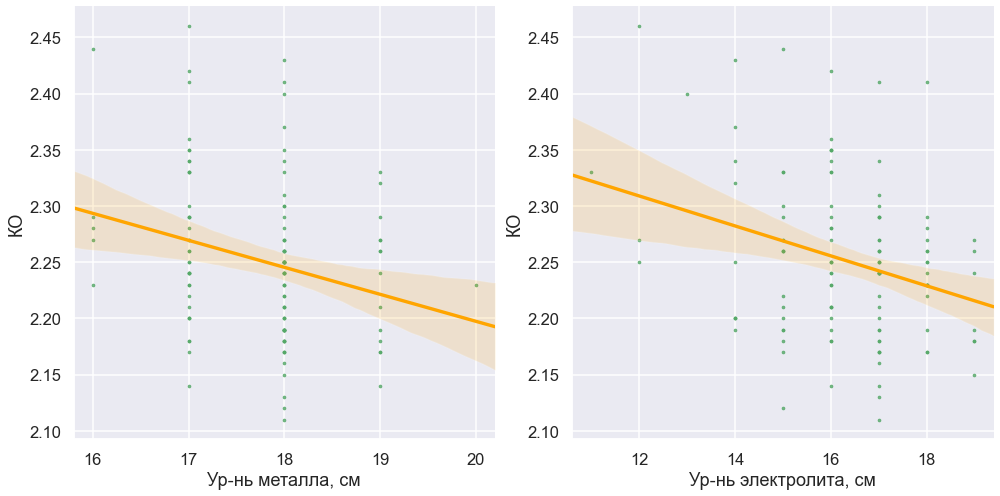

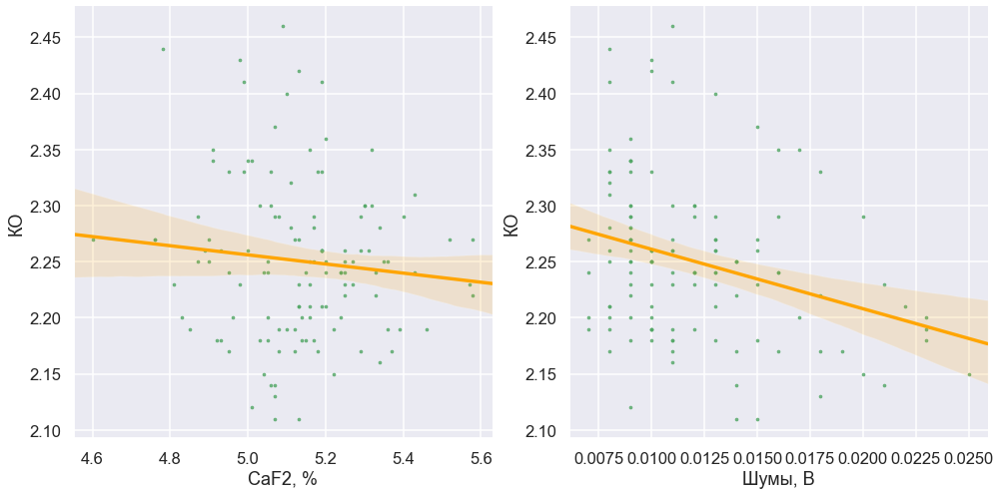

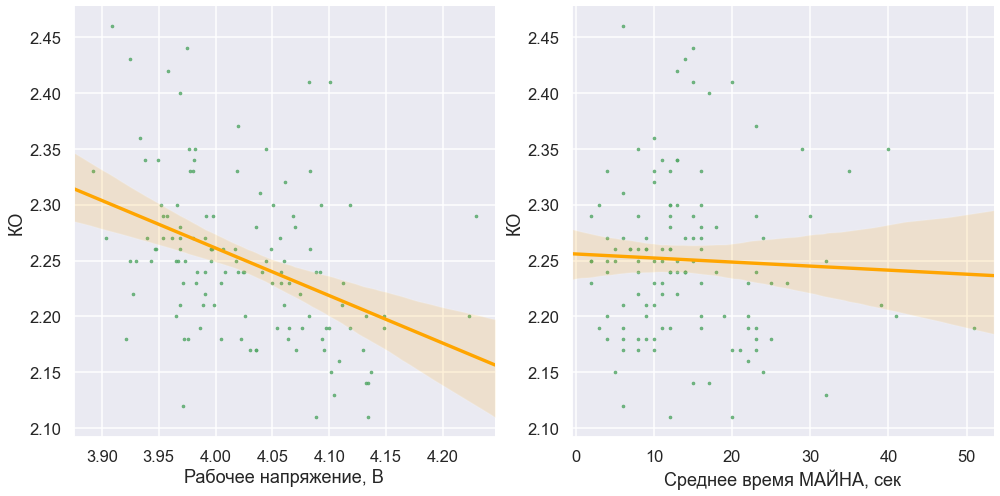

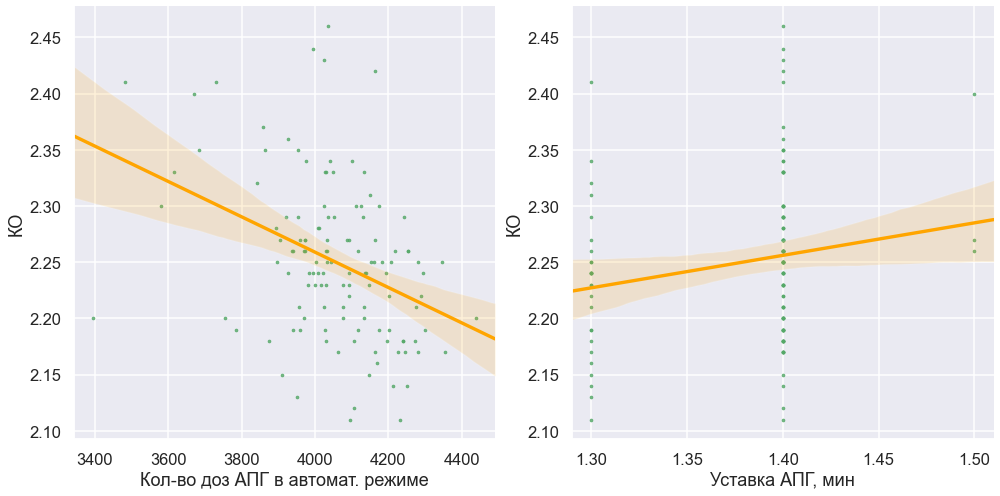

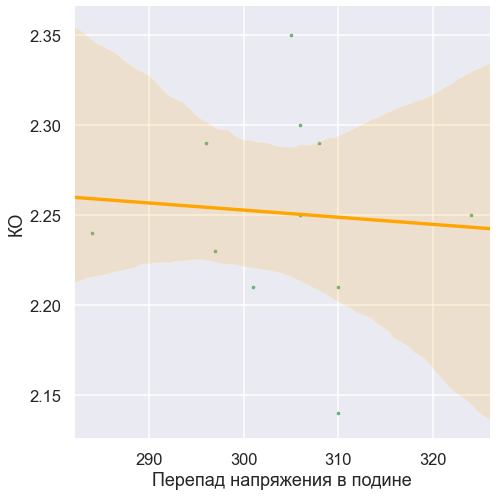

In [27]:
# pair plots
drawPairPlots(dataSingleUnit,inputNames, outputNames, paramNamesDictionary)


# Используем линейную интерполяцию для построения моделей

In [7]:
# lets use liniear interpolation for scalled data
for col in dataSingleUnitScaled.columns:
    if np.isnan(dataSingleUnitScaled.loc[0, col]):
        dataSingleUnitScaled.loc[0, col] = dataSingleUnitScaled[col].mean()
dataLineInterpol=dataSingleUnitScaled.interpolate(method='linear').copy()
dataLineInterpol.head()


,Metal,Electrolyte,Temp,KO,CAF2,Noise,Voltage,Mynah,Doze,APG,dVoltage
0,0.25,0.363636,0.404762,0.257143,0.459184,0.592593,0.728291,0.78,0.639693,0.333333,0.426775
1,0.25,0.545455,0.214286,0.242857,0.482143,0.222222,0.518207,0.04,0.800681,0.000000,0.479882
2,0.25,0.409091,0.297619,0.228571,0.505102,0.296296,0.700280,0.36,0.683986,0.000000,0.532988
3,0.25,0.272727,0.380952,0.214286,0.528061,0.296296,0.484594,0.62,0.219761,0.000000,0.586095
4,0.25,0.818182,0.214286,0.200000,0.551020,0.592593,0.621849,0.46,0.467632,0.333333,0.639201


# МГК

In [29]:
# PCA plots
pca1=PCA()
pcaData1=pca1.fit_transform(dataLineInterpol[inputNames])
print(np.array_str(pca1.explained_variance_ratio_*100, precision=2, suppress_small=True))


[24.62 19.56 12.82 11.25 10.68  7.73  5.57  4.71  3.06]


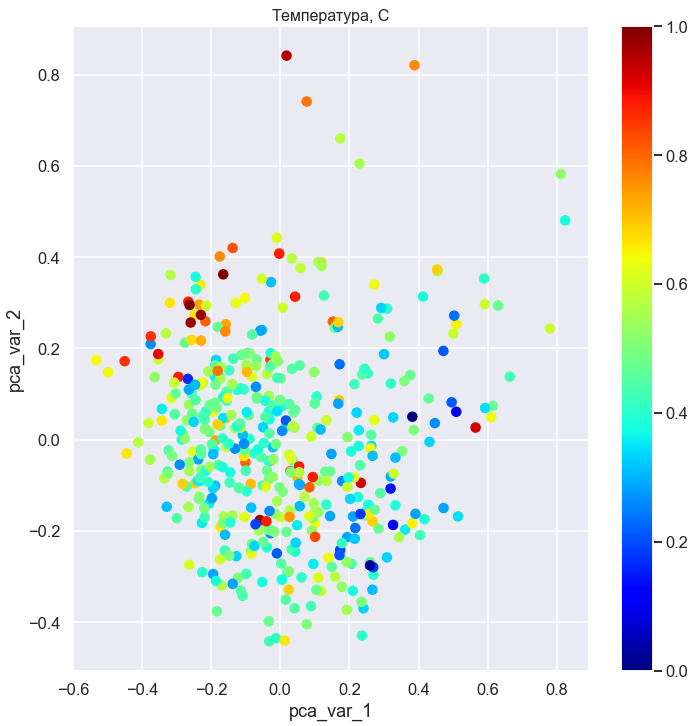

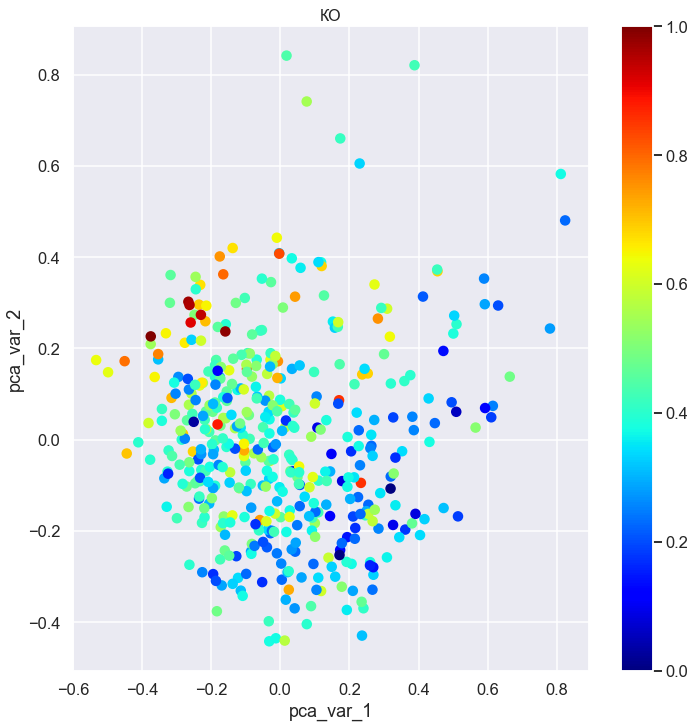

In [30]:
# draw flat pca plot
drawPCAFlatPlot(pcaData1,dataLineInterpol,outputNames,paramNamesDictionary)


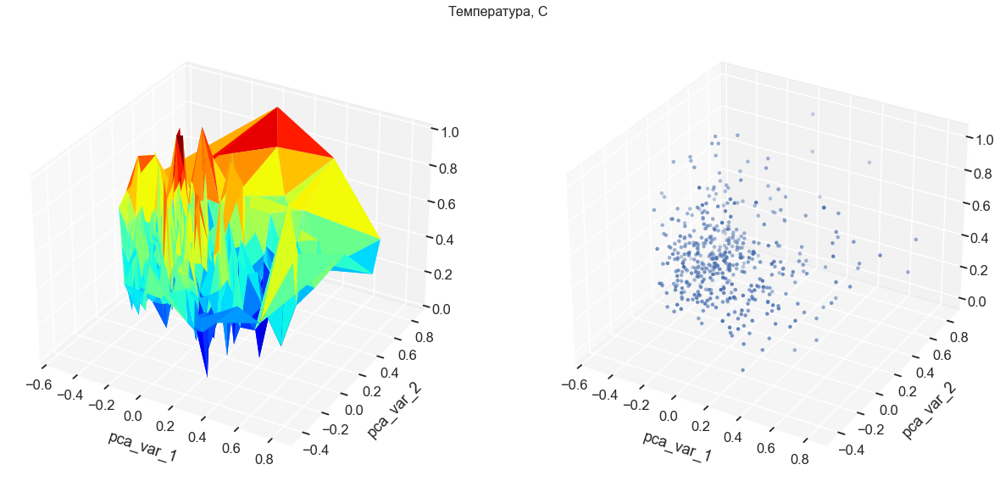

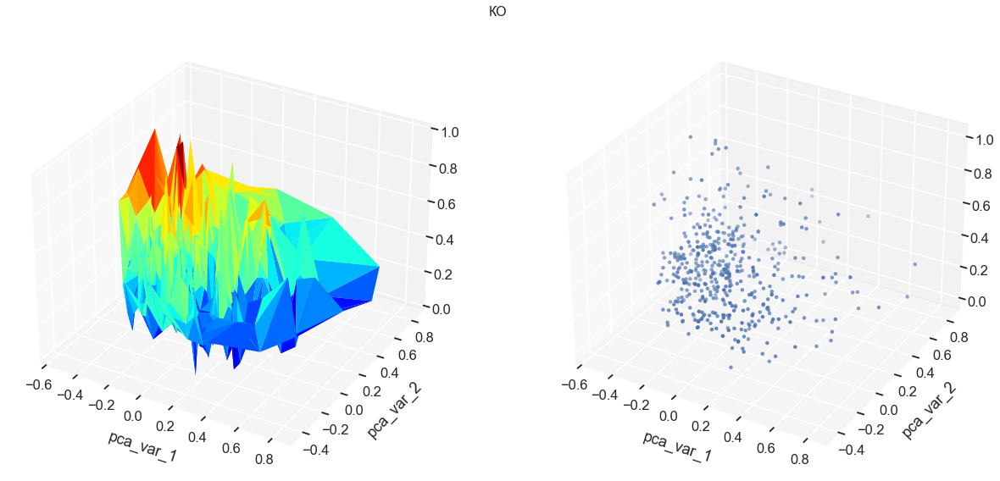

In [31]:
# draw flat pca plot
drawPCA3DPlot(pcaData1,dataLineInterpol,outputNames,paramNamesDictionary)


# Построение линейной модели

In [32]:
# lin models for TEMP with inputs excluding 2nd out
rezults1=analyzeLinModels(dataLineInterpol,inputNames, outputNames[0], paramNamesDictionary)
rezults1


,best,mean,std,median,worst
mse,0.117458,0.134360,0.008404,0.135495,0.152854
r2Score,0.458099,0.285020,0.107273,0.297353,-0.128530
mae,0.088944,0.103803,0.006946,0.103793,0.121651


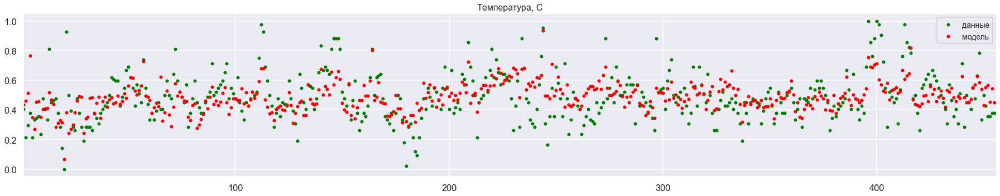

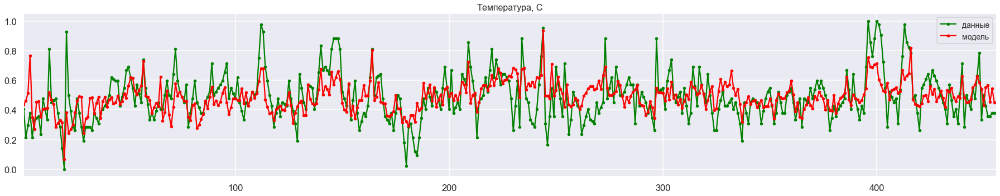

{'mse': 0.13014567725075743, 'r2score': 0.3564643698784826, 'mae': 0.10088843375320604}


,Переменная,Coefficients
0,Metal,-0.134916
1,Electrolyte,-0.371786
2,CAF2,0.007382
3,Noise,-0.194181
4,Voltage,-0.197349
5,Mynah,0.038453
6,Doze,-0.309249
7,APG,-0.157482
8,dVoltage,0.093242
9,intercept_coef,1.039842


In [33]:
modelPErformance1, coef1 = buildLinModels(dataLineInterpol,inputNames, outputNames[0], paramNamesDictionary, drawRez=True)
print(modelPErformance1)
coef1


In [34]:
# lin models for TEMP with inputs including 2nd out
inCols=inputNames.copy()
inCols.append(outputNames[1])
rezults2=analyzeLinModels(dataLineInterpol,inCols, outputNames[0], paramNamesDictionary)
rezults2


,best,mean,std,median,worst
mse,0.101052,0.114599,0.008704,0.115055,0.140266
r2Score,0.593942,0.461639,0.093196,0.475772,0.150877
mae,0.078246,0.089021,0.006577,0.088038,0.109122


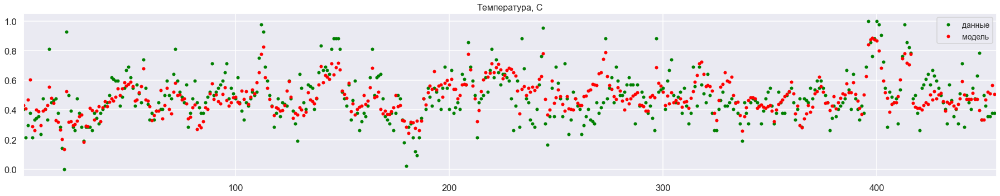

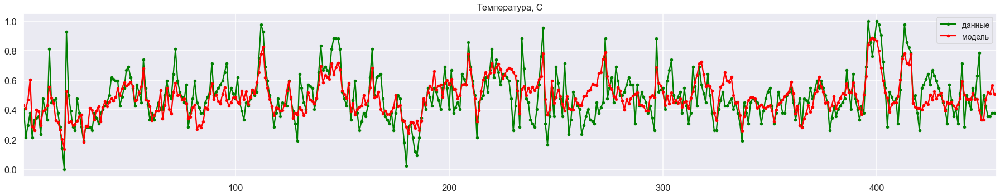

{'mse': 0.11311948169707724, 'r2score': 0.5138302704534712, 'mae': 0.08818649106884428}


,Переменная,Coefficients
0,Metal,-0.081644
1,Electrolyte,-0.304976
2,CAF2,0.023476
3,Noise,-0.170124
4,Voltage,-0.022841
5,Mynah,0.067436
6,Doze,-0.157111
7,APG,-0.127797
8,dVoltage,0.056466
9,KO,0.461374


In [35]:
modelPErformance2, coef2 = buildLinModels(dataLineInterpol,inCols, outputNames[0], paramNamesDictionary, drawRez=True)
print(modelPErformance2)
coef2


In [36]:
# lin models for KO with inputs excluding 2nd out
rezults3=analyzeLinModels(dataLineInterpol,inputNames, outputNames[1], paramNamesDictionary)
rezults3


,best,mean,std,median,worst
mse,0.122717,0.142517,0.008455,0.142411,0.161589
r2Score,0.412699,0.252752,0.065303,0.243173,0.128228
mae,0.095765,0.110834,0.006415,0.110789,0.123215


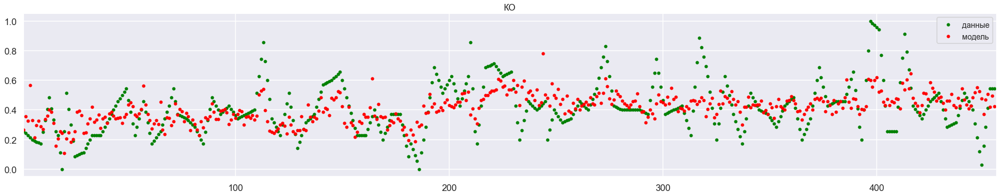

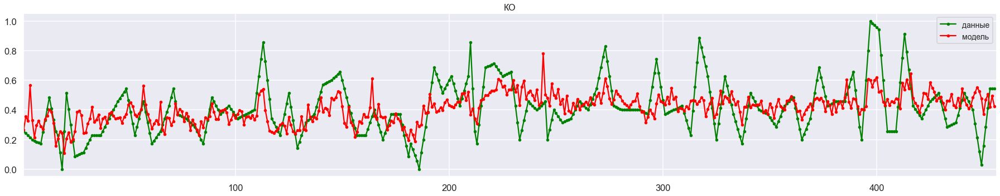

{'mse': 0.13949079629511282, 'r2score': 0.30634844958111573, 'mae': 0.10759626524998095}


,Переменная,Coefficients
0,Metal,-0.115464
1,Electrolyte,-0.144808
2,CAF2,-0.034882
3,Noise,-0.052142
4,Voltage,-0.378235
5,Mynah,-0.062820
6,Doze,-0.329750
7,APG,-0.064341
8,dVoltage,0.079710
9,intercept_coef,0.917337


In [37]:
modelPErformance3, coef3 = buildLinModels(dataLineInterpol,inputNames, outputNames[1], paramNamesDictionary, drawRez=True)
print(modelPErformance3)
coef3


In [38]:
# lin models for KO with inputs including 2nd out
inCols=inputNames.copy()
inCols.append(outputNames[0])
rezults4=analyzeLinModels(dataLineInterpol,inCols, outputNames[1], paramNamesDictionary)
rezults4


,best,mean,std,median,worst
mse,0.109750,0.125654,0.009192,0.124422,0.148393
r2Score,0.610513,0.460361,0.065029,0.465556,0.303957
mae,0.083270,0.095405,0.006501,0.094967,0.110493


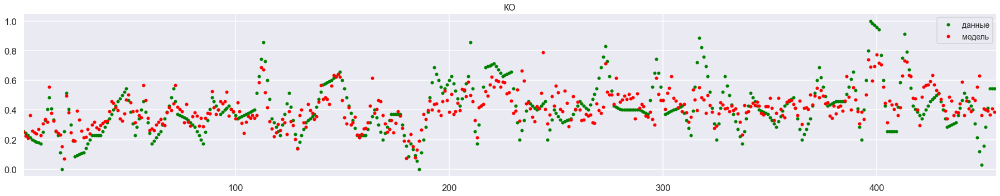

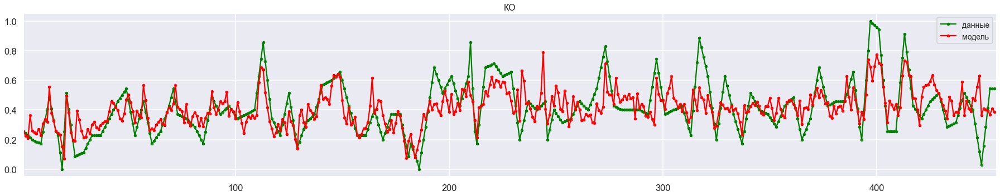

{'mse': 0.12124203363292198, 'r2score': 0.4759693622511617, 'mae': 0.09227138039787022}


,Переменная,Coefficients
0,Metal,-0.043957
1,Electrolyte,0.052243
2,CAF2,-0.038795
3,Noise,0.050776
4,Voltage,-0.273638
5,Mynah,-0.083200
6,Doze,-0.165844
7,APG,0.019126
8,dVoltage,0.030290
9,Temp,0.530011


In [39]:
modelPErformance4, coef4 = buildLinModels(dataLineInterpol,inCols, outputNames[1], paramNamesDictionary, drawRez=True)
print(modelPErformance4)
coef4


# Построение нелинейной модели (SVR)

In [40]:
# SVR models for TEMP with inputs excluding 2nd out
rezults1_=analyzeSVRModels(dataLineInterpol,inputNames, outputNames[0], paramNamesDictionary)
rezults1_


--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.104782,0.132145,0.009192,0.133358,0.149515
r2Score,0.467894,0.354076,0.058520,0.355950,0.217255
mae,0.081143,0.101331,0.006966,0.102541,0.116070


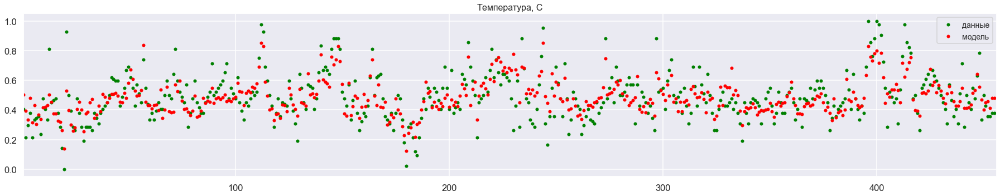

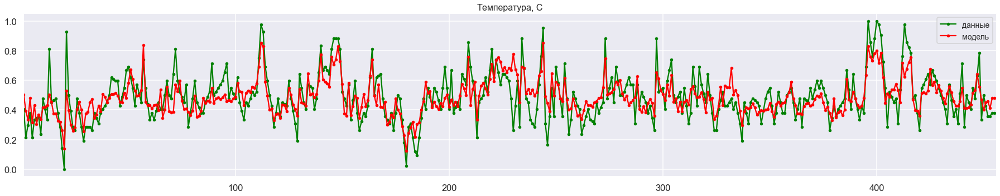

{'mse': 0.10279810427186867, 'r2score': 0.5985020674698179, 'mae': 0.08236491721701342}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [41]:
modelPErformance1_, coef1_ = buildSVRModels(dataLineInterpol,inputNames, outputNames[0], paramNamesDictionary, drawRez=True)
print(modelPErformance1_)
coef1_


In [42]:
# SVR models for TEMP with inputs including 2nd out
inCols=inputNames.copy()
inCols.append(outputNames[1])
rezults2_=analyzeSVRModels(dataLineInterpol,inCols, outputNames[0], paramNamesDictionary)
rezults2_


--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.095037,0.113830,0.008863,0.113916,0.129684
r2Score,0.646231,0.498949,0.086642,0.507706,0.261191
mae,0.074168,0.087080,0.006122,0.086460,0.099928


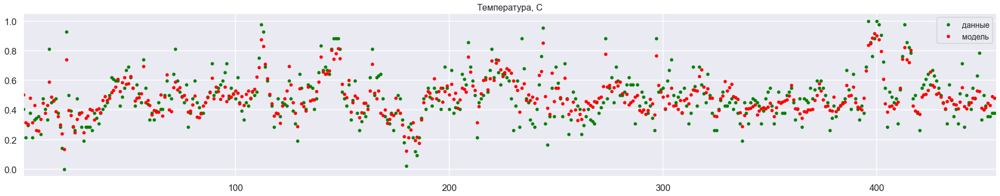

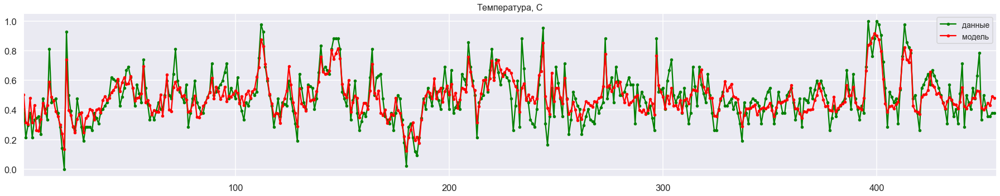

{'mse': 0.08723641800899776, 'r2score': 0.7108596174126143, 'mae': 0.07150344217462273}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [43]:
modelPErformance2_, coef2_ = buildSVRModels(dataLineInterpol,inCols, outputNames[0], paramNamesDictionary, drawRez=True)
print(modelPErformance2_)
coef2_

In [44]:
# SVR models for KO  with inputs excluding 2nd out
rezults3_=analyzeSVRModels(dataLineInterpol,inputNames, outputNames[1], paramNamesDictionary)
rezults3_

--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.119374,0.140842,0.008820,0.140291,0.163594
r2Score,0.440308,0.301294,0.079655,0.300486,0.047075
mae,0.092373,0.108553,0.006940,0.108911,0.120935


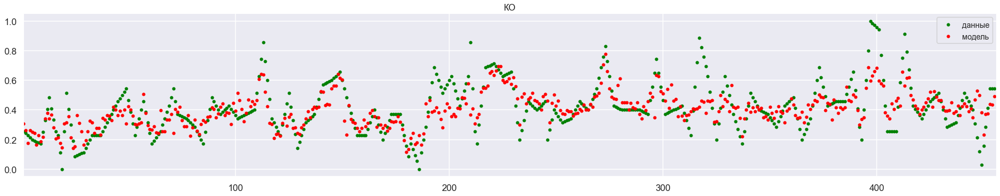

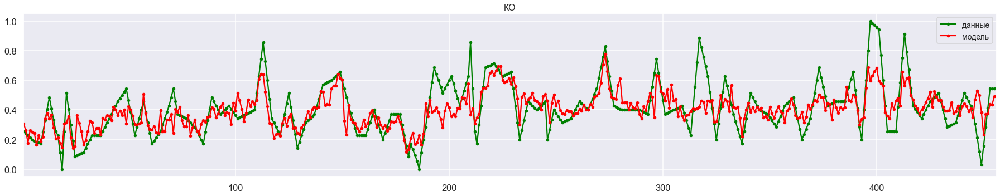

{'mse': 0.11239762366685918, 'r2score': 0.549635123339349, 'mae': 0.08217155336062354}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.05, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [45]:
modelPErformance3_, coef3_ = buildSVRModels(dataLineInterpol,inputNames, outputNames[1], paramNamesDictionary, drawRez=True)
print(modelPErformance3_)
coef3_

In [46]:
inCols=inputNames.copy()
inCols.append(outputNames[0])
rezults4_=analyzeSVRModels(dataLineInterpol,inCols, outputNames[1], paramNamesDictionary)
rezults4_

--------------------------------------------
SVR model analysis starts.
Run 1 from 40
Run 2 from 40
Run 3 from 40
Run 4 from 40
Run 5 from 40
Run 6 from 40
Run 7 from 40
Run 8 from 40
Run 9 from 40
Run 10 from 40
Run 11 from 40
Run 12 from 40
Run 13 from 40
Run 14 from 40
Run 15 from 40
Run 16 from 40
Run 17 from 40
Run 18 from 40
Run 19 from 40
Run 20 from 40
Run 21 from 40
Run 22 from 40
Run 23 from 40
Run 24 from 40
Run 25 from 40
Run 26 from 40
Run 27 from 40
Run 28 from 40
Run 29 from 40
Run 30 from 40
Run 31 from 40
Run 32 from 40
Run 33 from 40
Run 34 from 40
Run 35 from 40
Run 36 from 40
Run 37 from 40
Run 38 from 40
Run 39 from 40
Run 40 from 40
All runs are done.


,best,mean,std,median,worst
mse,0.103603,0.119074,0.007713,0.119922,0.134759
r2Score,0.612351,0.484359,0.087553,0.501730,0.240670
mae,0.077523,0.089700,0.005815,0.088975,0.100223


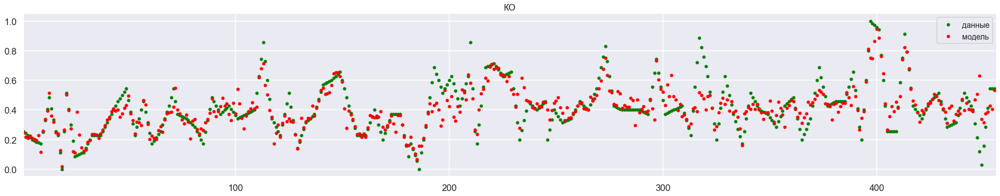

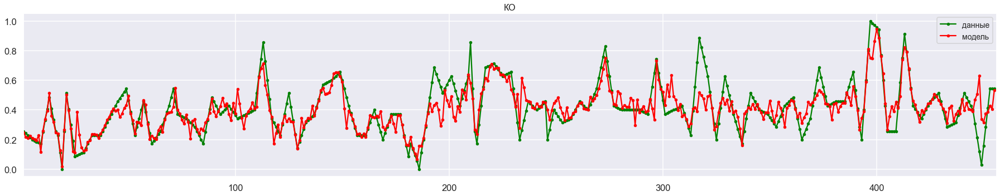

{'mse': 0.09163289368907053, 'r2score': 0.700668062187089, 'mae': 0.05899778719107596}


SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.01, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [47]:
modelPErformance4_, coef4_ = buildSVRModels(dataLineInterpol,inCols, outputNames[1], paramNamesDictionary, drawRez=True)
print(modelPErformance4_)
coef4_

# Итоговые сравнения

In [48]:
mtrxNames=['mse','r2Score','mae']

for name in mtrxNames:
    print('Результаты для',paramNamesDictionary[outputNames[0]],'мера',name,':')
    display(pd.DataFrame( {
                        'линейная регрессия (только входы)': rezults1.T[name],
                        'линейная регрессия (входы + КО)': rezults2.T[name],
                        'SVR (только входы)': rezults1_.T[name],
                        'SVR (входы + КО)': rezults2_.T[name],
                      } ).T )
    print('')

Результаты для Температура, С мера mse :


,best,mean,std,median,worst
линейная регрессия (только входы),0.117458,0.134360,0.008404,0.135495,0.152854
линейная регрессия (входы + КО),0.101052,0.114599,0.008704,0.115055,0.140266
SVR (только входы),0.104782,0.132145,0.009192,0.133358,0.149515
SVR (входы + КО),0.095037,0.113830,0.008863,0.113916,0.129684



Результаты для Температура, С мера r2Score :


,best,mean,std,median,worst
линейная регрессия (только входы),0.458099,0.285020,0.107273,0.297353,-0.128530
линейная регрессия (входы + КО),0.593942,0.461639,0.093196,0.475772,0.150877
SVR (только входы),0.467894,0.354076,0.058520,0.355950,0.217255
SVR (входы + КО),0.646231,0.498949,0.086642,0.507706,0.261191



Результаты для Температура, С мера mae :


,best,mean,std,median,worst
линейная регрессия (только входы),0.088944,0.103803,0.006946,0.103793,0.121651
линейная регрессия (входы + КО),0.078246,0.089021,0.006577,0.088038,0.109122
SVR (только входы),0.081143,0.101331,0.006966,0.102541,0.116070
SVR (входы + КО),0.074168,0.087080,0.006122,0.086460,0.099928


In [49]:
mtrxNames=['mse','r2Score','mae']
for name in mtrxNames:
    print('Результаты для',paramNamesDictionary[outputNames[1]],'мера',name,':')
    display(pd.DataFrame( {
                        'линейная регрессия (только входы)': rezults3.T[name],
                        'линейная регрессия (входы + КО)': rezults4.T[name],
                        'SVR (только входы)': rezults3_.T[name],
                        'SVR (входы + КО)': rezults4_.T[name],
                      } ).T )
    print('')

Результаты для КО мера mse :


,best,mean,std,median,worst
линейная регрессия (только входы),0.122717,0.142517,0.008455,0.142411,0.161589
линейная регрессия (входы + КО),0.109750,0.125654,0.009192,0.124422,0.148393
SVR (только входы),0.119374,0.140842,0.008820,0.140291,0.163594
SVR (входы + КО),0.103603,0.119074,0.007713,0.119922,0.134759



Результаты для КО мера r2Score :


,best,mean,std,median,worst
линейная регрессия (только входы),0.412699,0.252752,0.065303,0.243173,0.128228
линейная регрессия (входы + КО),0.610513,0.460361,0.065029,0.465556,0.303957
SVR (только входы),0.440308,0.301294,0.079655,0.300486,0.047075
SVR (входы + КО),0.612351,0.484359,0.087553,0.501730,0.240670



Результаты для КО мера mae :


,best,mean,std,median,worst
линейная регрессия (только входы),0.095765,0.110834,0.006415,0.110789,0.123215
линейная регрессия (входы + КО),0.083270,0.095405,0.006501,0.094967,0.110493
SVR (только входы),0.092373,0.108553,0.006940,0.108911,0.120935
SVR (входы + КО),0.077523,0.089700,0.005815,0.088975,0.100223


In [50]:
# whole data on Temp
tempDF=pd.DataFrame({
                        'Целевой параметр': [],
                        'Метрика': [],
                        'Модель': [],
                        'best': [],
                        'mean': [],
                        'std': [],
                        'median': [],    
                        'worst': []
                    })
tempDF

,Целевой параметр,Метрика,Модель,best,mean,std,median,worst


In [51]:
mtrxNames=['mse','r2Score','mae']
modelNames=['линейная регрессия (только входы)', 'линейная регрессия (входы + КО)','SVR (только входы)','SVR (входы + КО)']

for target in outputNames:
    for name in mtrxNames:
        for model in modelNames:
            tmp=[]
            tmp.append( paramNamesDictionary[target] )
            tmp.append( name )
            tmp.append( model )
            if model == 'линейная регрессия (только входы)':
                tmp.extend( rezults1.T[name].values)
            elif model == 'линейная регрессия (входы + КО)':
                tmp.extend( rezults2.T[name].values)
            elif model == 'SVR (только входы)':
                tmp.extend( rezults1_.T[name].values)
            elif model == 'SVR (входы + КО)':
                tmp.extend( rezults2_.T[name].values)
            tempDF.loc[len(tempDF)]=tmp

tempDF

,Целевой параметр,Метрика,Модель,best,mean,std,median,worst
0,"Температура, С",mse,линейная регрессия (только входы),0.117458,0.134360,0.008404,0.135495,0.152854
1,"Температура, С",mse,линейная регрессия (входы + КО),0.101052,0.114599,0.008704,0.115055,0.140266
2,"Температура, С",mse,SVR (только входы),0.104782,0.132145,0.009192,0.133358,0.149515
3,"Температура, С",mse,SVR (входы + КО),0.095037,0.113830,0.008863,0.113916,0.129684
4,"Температура, С",r2Score,линейная регрессия (только входы),0.458099,0.285020,0.107273,0.297353,-0.128530
5,"Температура, С",r2Score,линейная регрессия (входы + КО),0.593942,0.461639,0.093196,0.475772,0.150877
6,"Температура, С",r2Score,SVR (только входы),0.467894,0.354076,0.058520,0.355950,0.217255
7,"Температура, С",r2Score,SVR (входы + КО),0.646231,0.498949,0.086642,0.507706,0.261191
8,"Температура, С",mae,линейная регрессия (только входы),0.088944,0.103803,0.006946,0.103793,0.121651
9,"Температура, С",mae,линейная регрессия (входы + КО),0.078246,0.089021,0.006577,0.088038,0.109122


<Figure size 1296x720 with 0 Axes>

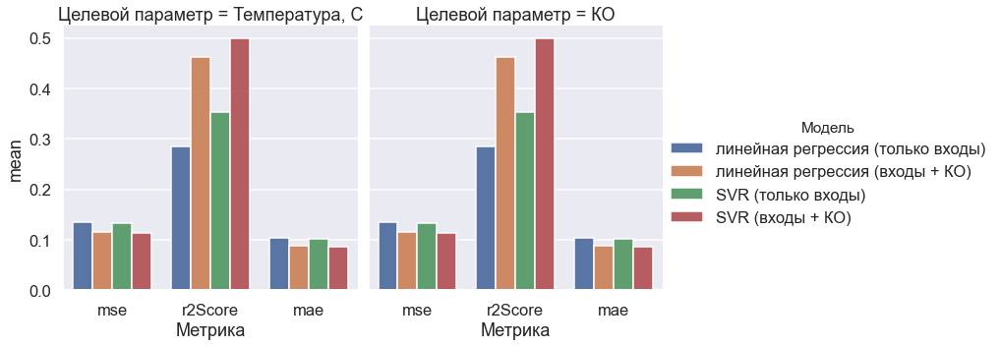

In [52]:
plt.figure(figsize=(18, 10))
ax = sns.catplot(x="Метрика", y="mean",
                hue="Модель", col="Целевой параметр",
                data=tempDF, kind="bar")
#plt.tight_layout(pad=0.4)
plt.show()

<Figure size 1296x720 with 0 Axes>

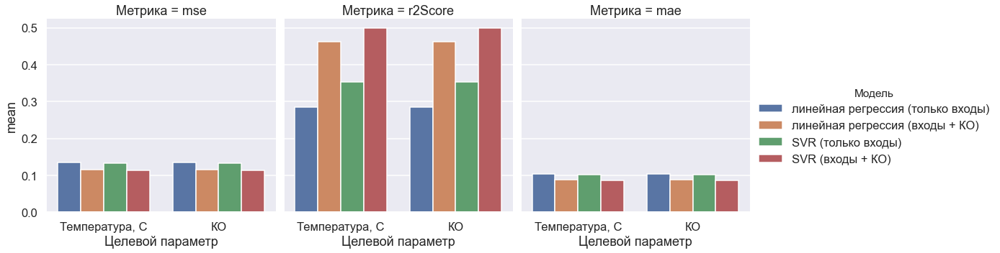

In [53]:
plt.figure(figsize=(18, 10))
ax = sns.catplot(x="Целевой параметр", y="mean",
                hue="Модель", col="Метрика",
                data=tempDF, kind="bar")
#plt.tight_layout(pad=0.4)
plt.show()

In [8]:
from keras.models import Sequential
from keras.layers import Dense, Activation

Using TensorFlow backend.


In [9]:
dataInputs=dataLineInterpol.drop(columns=['Temp','KO']).copy()
dataTargets=dataLineInterpol[['Temp','KO']].copy()

In [54]:
model = Sequential()
model.add(Dense(40, input_shape=(9,), activation='relu'))
model.add(Dense(20, input_shape=(9,), activation='relu'))
model.add(Dense(1, activation='linear'))
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 40)                400       
_________________________________________________________________
dense_8 (Dense)              (None, 20)                820       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 21        
Total params: 1,241
Trainable params: 1,241
Non-trainable params: 0
_________________________________________________________________


In [55]:
model.compile(loss='mean_squared_error', optimizer='adam',
        metrics=['mean_squared_error', 'mean_absolute_error', ])

In [56]:
trainInputs, testInputs, trainTargets, testTargets = train_test_split(dataInputs,
                                                                      dataTargets['Temp'].values, test_size=0.25)

In [57]:
nnModel=model.fit(
    trainInputs, trainTargets, 
    validation_data=(testInputs, testTargets),
    epochs=500,
    verbose=1)

Train on 341 samples, validate on 114 samples
Epoch 1/500
341/341 [==============================] - 0s 1ms/step - loss: 0.5301 - mean_squared_error: 0.5301 - mean_absolute_error: 0.7060 - val_loss: 0.3587 - val_mean_squared_error: 0.3587 - val_mean_absolute_error: 0.5793
Epoch 2/500
341/341 [==============================] - 0s 35us/step - loss: 0.2694 - mean_squared_error: 0.2694 - mean_absolute_error: 0.4907 - val_loss: 0.2003 - val_mean_squared_error: 0.2003 - val_mean_absolute_error: 0.4188
Epoch 3/500
341/341 [==============================] - 0s 59us/step - loss: 0.1397 - mean_squared_error: 0.1397 - mean_absolute_error: 0.3324 - val_loss: 0.0899 - val_mean_squared_error: 0.0899 - val_mean_absolute_error: 0.2525
Epoch 4/500
341/341 [==============================] - 0s 32us/step - loss: 0.0567 - mean_squared_error: 0.0567 - mean_absolute_error: 0.1822 - val_loss: 0.0379 - val_mean_squared_error: 0.0379 - val_mean_absolute_error: 0.1469
Epoch 5/500
341/341 [======================

In [33]:
print(nnModel.history.keys())

dict_keys(['val_loss', 'val_mean_squared_error', 'val_mean_absolute_error', 'loss', 'mean_squared_error', 'mean_absolute_error'])


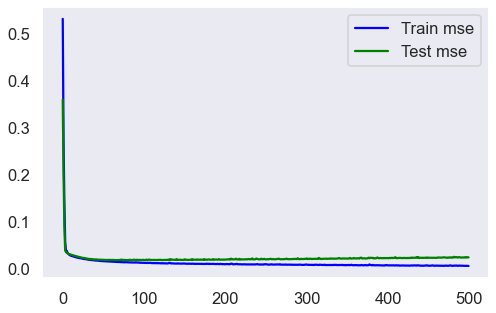

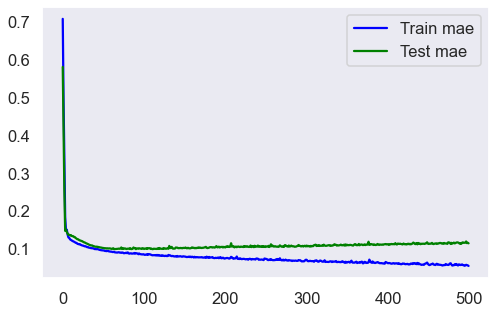

In [58]:
# из отчета можно построить графики изменения мер качества
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel.history['mean_squared_error'], color='blue', label='Train mse')
ax.plot(nnModel.history['val_mean_squared_error'], color='green', label='Test mse')
ax.legend()
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel.history['mean_absolute_error'], color='blue', label='Train mae')
ax.plot(nnModel.history['val_mean_absolute_error'], color='green', label='Test mae')
ax.legend()
plt.grid()
plt.show()

In [59]:
scores = model.evaluate(
    dataInputs.values, dataTargets['Temp'],
    verbose=1)

455/455 [==============================] - 0s 26us/step


In [60]:
pred = model.predict(dataInputs)
print( 'mse=', mtrcs.mean_squared_error(dataTargets['Temp'], pred, squared=False) )
print( 'r2=', mtrcs.r2_score(dataTargets['Temp'], pred) )
print( 'mae=', mtrcs.mean_absolute_error(dataTargets['Temp'], pred) )

mse= 0.09790050362633536
r2= 0.6358477870002288
mae= 0.06924191613680156


# more deep NN

In [10]:
model2 = Sequential()
model2.add(Dense(100, input_shape=(9,), activation='relu', init='he_normal'))
model2.add(Dense(100, activation='relu', init='he_normal'))
model2.add(Dense(1, activation='linear', init='he_normal'))
model2.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 100)               1000      
_________________________________________________________________
dense_2 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 101       
Total params: 11,201
Trainable params: 11,201
Non-trainable params: 0
_________________________________________________________________


In [11]:
model2.compile(loss='mean_squared_error', optimizer='adam',
        metrics=['mean_squared_error', 'mean_absolute_error', ])

In [12]:
trainInputs, testInputs, trainTargets, testTargets = train_test_split(dataInputs,
                                                                      dataTargets['Temp'].values, test_size=0.25)

In [13]:
nnModel2=model2.fit(
    trainInputs, trainTargets, 
    validation_data=(testInputs, testTargets),
    epochs=500,
    verbose=1)

Train on 341 samples, validate on 114 samples
Epoch 1/500
341/341 [==============================] - 1s 4ms/step - loss: 0.0534 - mean_squared_error: 0.0534 - mean_absolute_error: 0.1789 - val_loss: 0.0480 - val_mean_squared_error: 0.0480 - val_mean_absolute_error: 0.1747
Epoch 2/500
341/341 [==============================] - 0s 64us/step - loss: 0.0372 - mean_squared_error: 0.0372 - mean_absolute_error: 0.1514 - val_loss: 0.0366 - val_mean_squared_error: 0.0366 - val_mean_absolute_error: 0.1516
Epoch 3/500
341/341 [==============================] - 0s 64us/step - loss: 0.0300 - mean_squared_error: 0.0300 - mean_absolute_error: 0.1343 - val_loss: 0.0296 - val_mean_squared_error: 0.0296 - val_mean_absolute_error: 0.1322
Epoch 4/500
341/341 [==============================] - 0s 59us/step - loss: 0.0280 - mean_squared_error: 0.0280 - mean_absolute_error: 0.1295 - val_loss: 0.0286 - val_mean_squared_error: 0.0286 - val_mean_absolute_error: 0.1258
Epoch 5/500
341/341 [======================

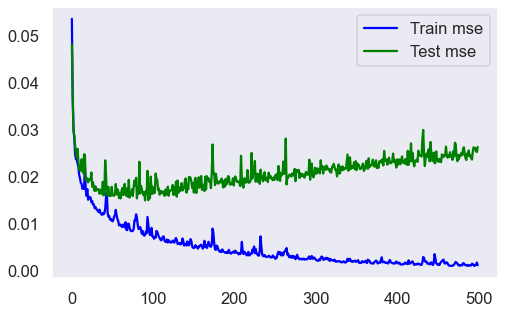

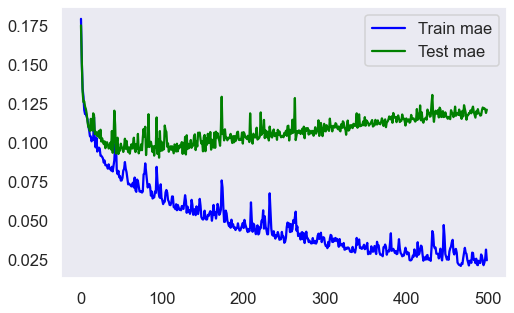

In [14]:
# из отчета можно построить графики изменения мер качества
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel2.history['mean_squared_error'], color='blue', label='Train mse')
ax.plot(nnModel2.history['val_mean_squared_error'], color='green', label='Test mse')
ax.legend()
plt.grid()
plt.show()

fig, ax = plt.subplots(figsize=(8,5))
ax.plot(nnModel2.history['mean_absolute_error'], color='blue', label='Train mae')
ax.plot(nnModel2.history['val_mean_absolute_error'], color='green', label='Test mae')
ax.legend()
plt.grid()
plt.show()

In [15]:
pred2 = model2.predict(dataInputs)
print( 'mse=', mtrcs.mean_squared_error(dataTargets['Temp'], pred2, squared=False) )
print( 'r2=', mtrcs.r2_score(dataTargets['Temp'], pred2) )
print( 'mae=', mtrcs.mean_absolute_error(dataTargets['Temp'], pred2) )

mse= 0.08862743073354488
r2= 0.701565229852552
mae= 0.05633951976840728


In [17]:
xAxis=np.arange(1,len(pred2)+1)
fig, ax = plt.subplots(figsize=(25,5))
ax.scatter(xAxis,dataTargets['Temp'], color='green', marker='.', label='данные')
ax.scatter(xAxis,pred2, color='red', marker='.', label='модель')
ax.set_xlim(1,len(pred2)+1)
ax.legend(fontsize=14)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(25,5))
ax.plot(xAxis,dataTargets['Temp'], color='green', marker='.', label='данные')
ax.plot(xAxis,pred2, color='red', marker='.', label='модель')
ax.set_xlim(1,len(pred2)+1)
ax.legend(fontsize=14)
plt.tight_layout()
plt.show()        

NameError: name 'realNamesDict' is not defined